# Ball Flight Ã¢â€ â€™ Shot Outcome Analysis

**Goal:** Identify which ball flight variables best predict shot accuracy (`Ball.Distance.from.Center`), broken down by shot location.

**Variable categories:**
- **Result (targets, never predictors):** `Ball.Distance.from.Center`, `Ball_Depth`, `left_right`, `Made`
- **Ball Flight (predictors):** `Ball_to_Rim_Angle`, `Ball_Velocity`, `Release.Height` (normalized by height), `Initial.Ball.Angle`, `Initial.Ball.Velocity`, `Max.Ball.Arc`
- **Stratify by:** `Shot.Location` (analyze each independently)

## Section 1: Setup & Data Loading

In [130]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.dpi'] = 100
sns.set_theme(style='whitegrid')

In [131]:
DATA_PATH = 'capstone2026v2.csv'
df = pd.read_csv(DATA_PATH)

# Results variables are the list of all the outcome/result variables. They should not be used as predictors.
# Target is the dependent variable we are trying to predict. Ball distance from center accounts for ball depth and left/right.
# Ball Distance from Center will now be called BDfC
RESULT_VARS = ['Ball.Distance.from.Center', 'Ball_Depth', 'left_right', 'Made']
TARGET = 'Ball.Distance.from.Center'

# We normalized all release height (Release height / player height) because taller players release the ball higher.
# Normalizing compares the mechanics of the shot rather than the body size.
df['Release_Height_norm'] = df['Release.Height'] / df['ht']

PREDICTORS = [
    'Ball_to_Rim_Angle',
    'Ball_Velocity',
    'Release_Height_norm', 
    'Initial.Ball.Angle',
    'Initial.Ball.Velocity',
    'Max.Ball.Arc',
]

PREDICTOR_LABELS = {
    'Ball_to_Rim_Angle':    'Ball-to-Rim Angle',
    'Ball_Velocity':        'Ball Velocity',
    'Release_Height_norm':  'Release Height (norm by ht)',
    'Initial.Ball.Angle':   'Initial Ball Angle',
    'Initial.Ball.Velocity':'Initial Ball Velocity',
    'Max.Ball.Arc':         'Max Ball Arc (height)',
}

# Drop rows missing any key column
required_cols = PREDICTORS + [TARGET, 'Shot.Location']
df_clean = df.dropna(subset=required_cols).copy()
df_clean['Made'] = df_clean['Made'].astype(bool)

# Remove players with fewer than 20 total shots
MIN_PLAYER_SHOTS = 20
player_shot_counts = df_clean.groupby('Name').size()
valid_players = player_shot_counts[player_shot_counts >= MIN_PLAYER_SHOTS].index
n_before = len(df_clean)
df_clean = df_clean[df_clean['Name'].isin(valid_players)].copy()
n_removed = n_before - len(df_clean)
n_players_removed = len(player_shot_counts) - len(valid_players)
print('Players removed (< 20 shots):', n_players_removed, '| Rows removed:', n_removed)

print('Total rows after cleaning:', len(df_clean))
print('Shots per location:')
print(df_clean['Shot.Location'].value_counts().to_string())

# Combining the 'Off the Dribble' and 'Catch and Shoot' free throws since they are the same
COMBINE_SHOT_TYPES = {'Free Throw'}
df_clean.loc[df_clean['Shot.Location'].isin(COMBINE_SHOT_TYPES), 'Shot.Type'] = 'All'

print('Shot type breakdown after combining:')
print(df_clean.groupby(['Shot.Location', 'Shot.Type']).size().to_string())


Players removed (< 20 shots): 22 | Rows removed: 182
Total rows after cleaning: 25162
Shots per location:
Shot.Location
Left Corner Three     4832
Middle Three          4832
Right Corner Three    4817
Free Throw            3794
Key                   1796
Left Wing Three       1566
Right Wing Three      1435
Left Corner Two        588
Middle Two             586
Right Corner Two       517
Left Wing Two          202
Right Wing Two         197
Shot type breakdown after combining:
Shot.Location       Shot.Type      
Free Throw          All                3794
Key                 Catch and Shoot     510
                    Off the Dribble    1286
Left Corner Three   Catch and Shoot     950
                    Off the Dribble    3882
Left Corner Two     Catch and Shoot     261
                    Off the Dribble     327
Left Wing Three     Catch and Shoot    1022
                    Off the Dribble     544
Left Wing Two       Catch and Shoot     116
                    Off the Dribble      86

## Section 2: Modeling and Heatmaps -- Per Shot Location x Shot Type

For each Location x Shot Type combination (n >= 200):
- Fit a **Random Forest** to predict `Ball.Distance.from.Center`
- Report R2, RMSE, and top 2 most important predictors
- Show a 2D heatmap of the top 2 predictors (color = predicted BDfC)

Note: Free Throw shot types are combined into 'All' (done in Section 1).


  Left Corner Three | Off the Dribble  (n=3882)
  RF R2=0.1238  RMSE=2.728
  Top 2: Ball Velocity  |  Initial Ball Velocity


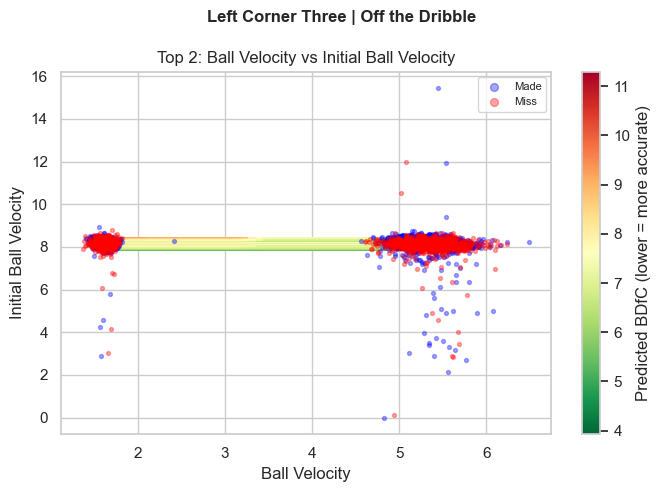


  Left Corner Three | Catch and Shoot  (n=950)
  RF R2=-0.0864  RMSE=3.009
  Top 2: Ball Velocity  |  Initial Ball Velocity


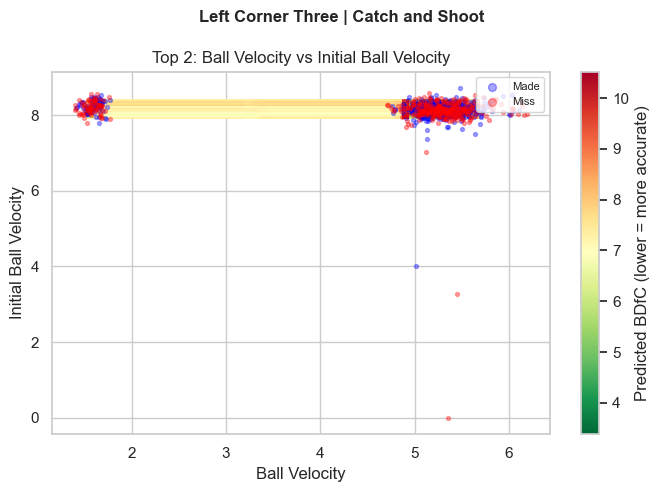


  Right Corner Three | Catch and Shoot  (n=2575)
  RF R2=0.1222  RMSE=2.611
  Top 2: Ball Velocity  |  Initial Ball Velocity


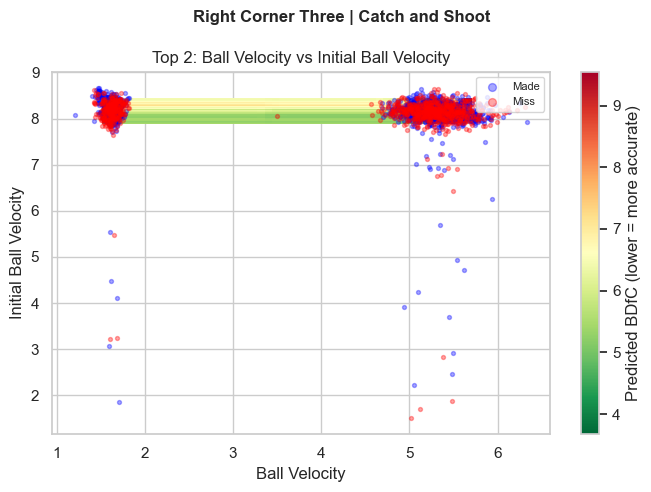


  Right Corner Three | Off the Dribble  (n=2242)
  RF R2=0.0502  RMSE=2.788
  Top 2: Max Ball Arc (height)  |  Initial Ball Velocity


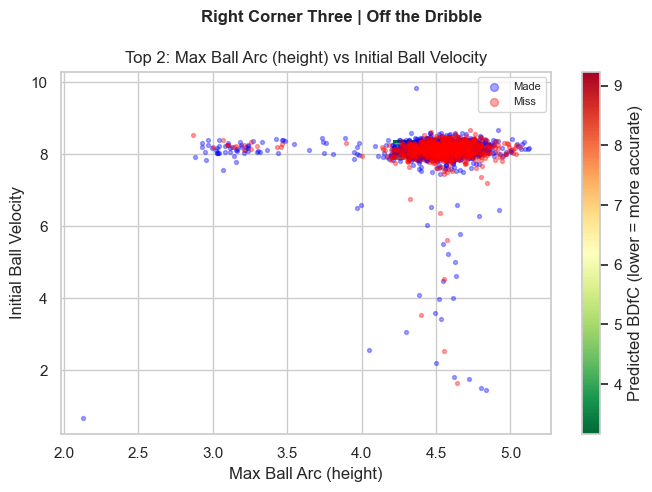


  Middle Three | Catch and Shoot  (n=4130)
  RF R2=0.1445  RMSE=3.178
  Top 2: Initial Ball Velocity  |  Release Height (norm by ht)


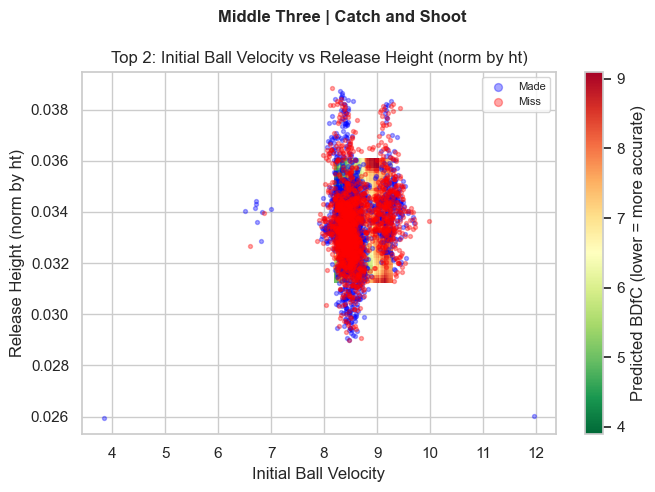


  Middle Three | Off the Dribble  (n=702)
  RF R2=0.0498  RMSE=3.703
  Top 2: Initial Ball Velocity  |  Initial Ball Angle


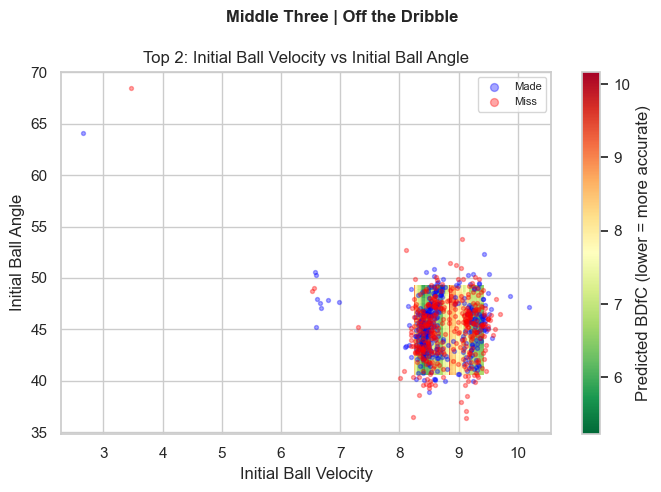


  Free Throw | All  (n=3794)
  RF R2=0.1592  RMSE=2.255
  Top 2: Initial Ball Velocity  |  Ball Velocity


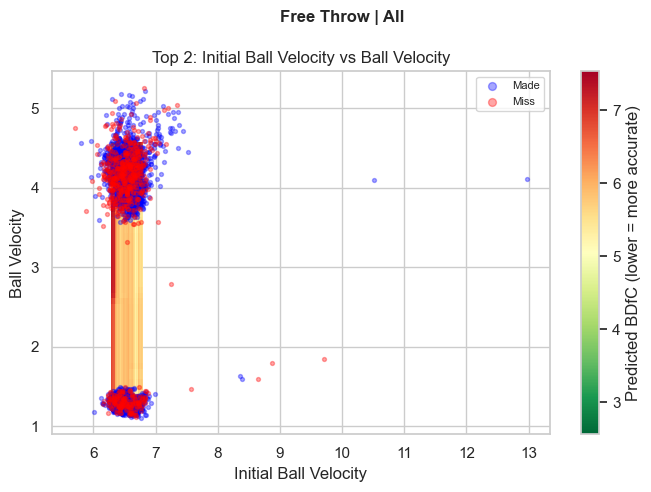


  Key | Off the Dribble  (n=1286)
  RF R2=0.0495  RMSE=3.872
  Top 2: Ball Velocity  |  Initial Ball Velocity


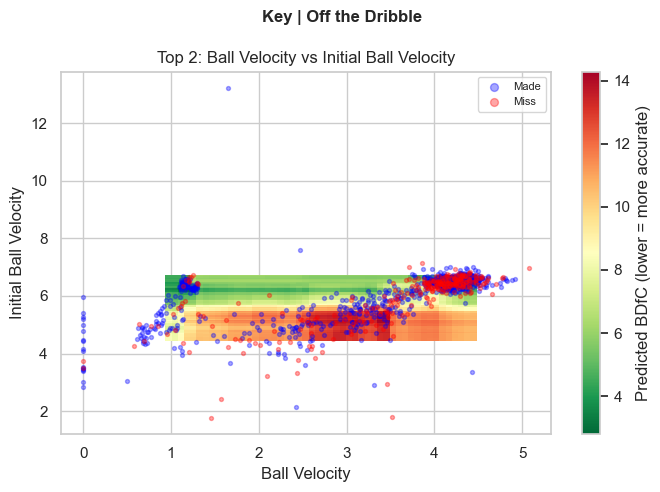


  Key | Catch and Shoot  (n=510)
  RF R2=0.1286  RMSE=3.892
  Top 2: Release Height (norm by ht)  |  Initial Ball Velocity


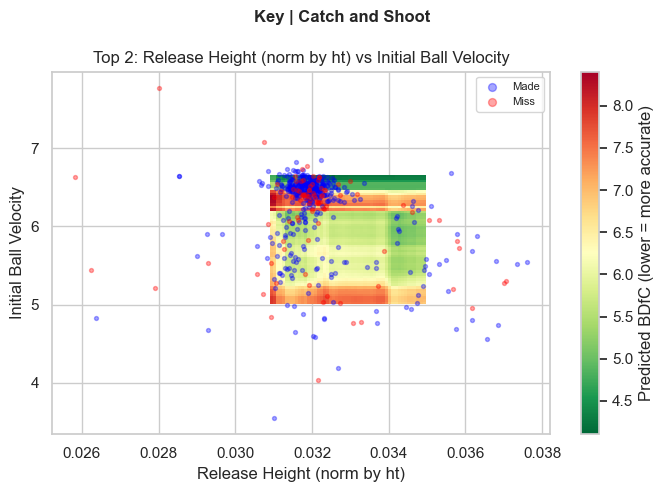


  Right Corner Two | Catch and Shoot  (n=294)
  RF R2=-0.0655  RMSE=2.781
  Top 2: Ball Velocity  |  Max Ball Arc (height)


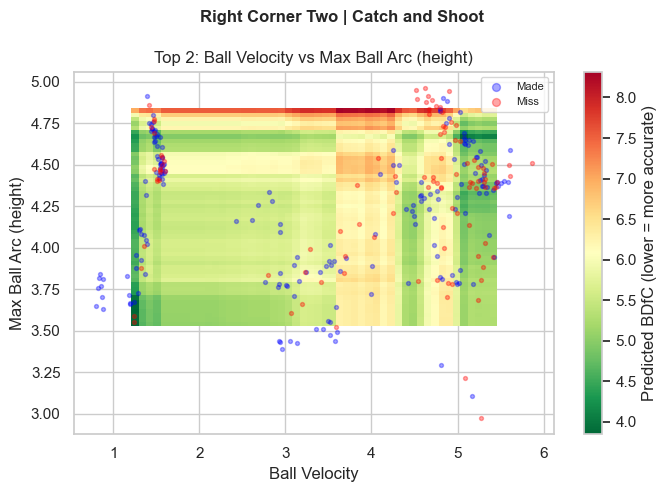


  Right Corner Two | Off the Dribble  (n=223)
  RF R2=-0.0142  RMSE=3.484
  Top 2: Ball-to-Rim Angle  |  Release Height (norm by ht)


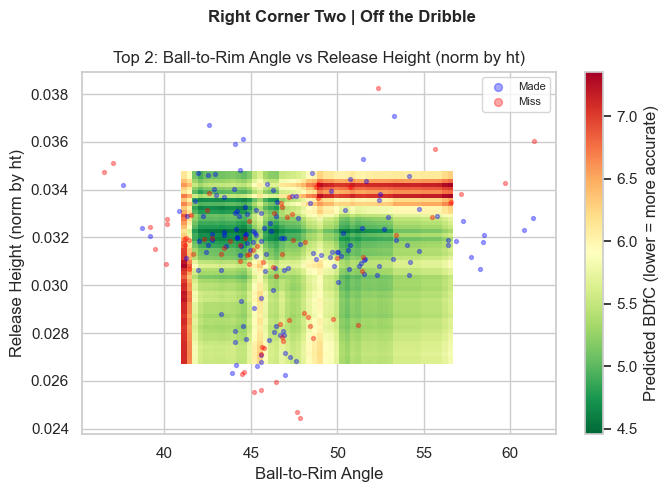


  Left Corner Two | Off the Dribble  (n=327)
  RF R2=0.1961  RMSE=5.74
  Top 2: Initial Ball Velocity  |  Release Height (norm by ht)


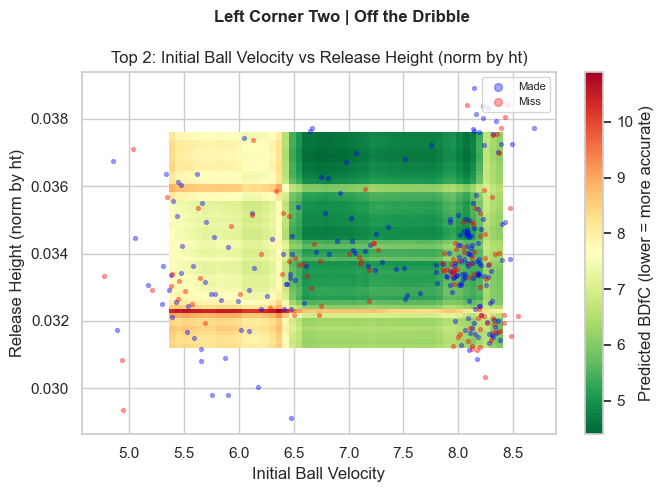


  Left Corner Two | Catch and Shoot  (n=261)
  RF R2=0.07  RMSE=3.873
  Top 2: Ball Velocity  |  Initial Ball Angle


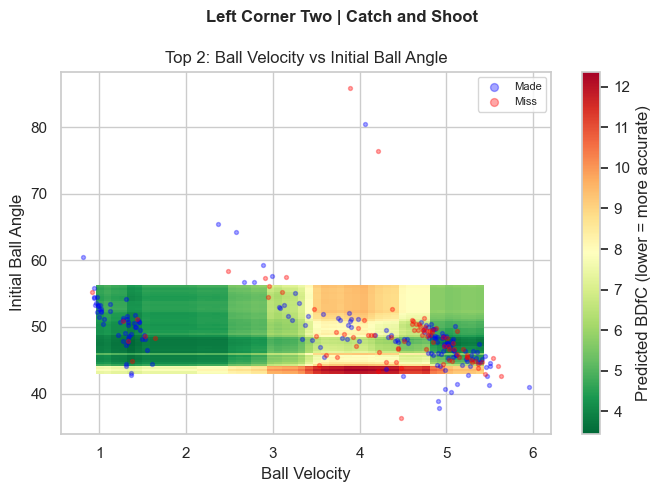


  Right Wing Three | Off the Dribble  (n=378)
  RF R2=-0.0147  RMSE=2.869
  Top 2: Release Height (norm by ht)  |  Initial Ball Angle


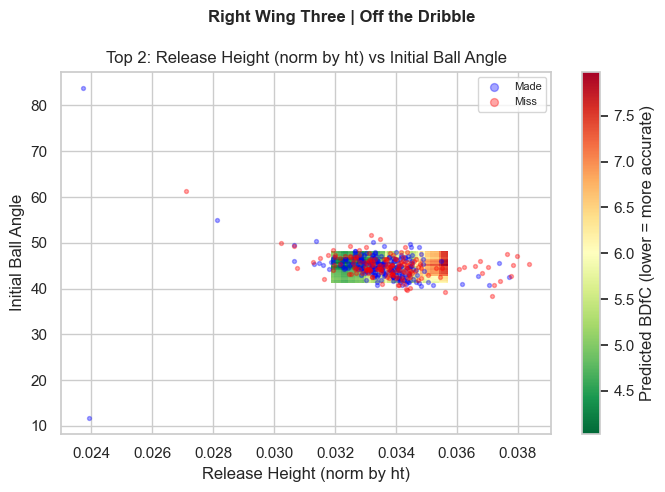


  Right Wing Three | Catch and Shoot  (n=1057)
  RF R2=0.0551  RMSE=2.61
  Top 2: Initial Ball Velocity  |  Release Height (norm by ht)


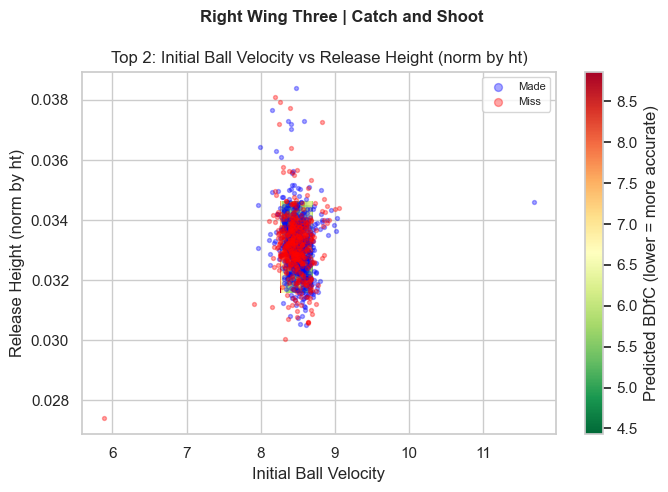


  Left Wing Three | Catch and Shoot  (n=1022)
  RF R2=-0.003  RMSE=2.818
  Top 2: Initial Ball Velocity  |  Release Height (norm by ht)


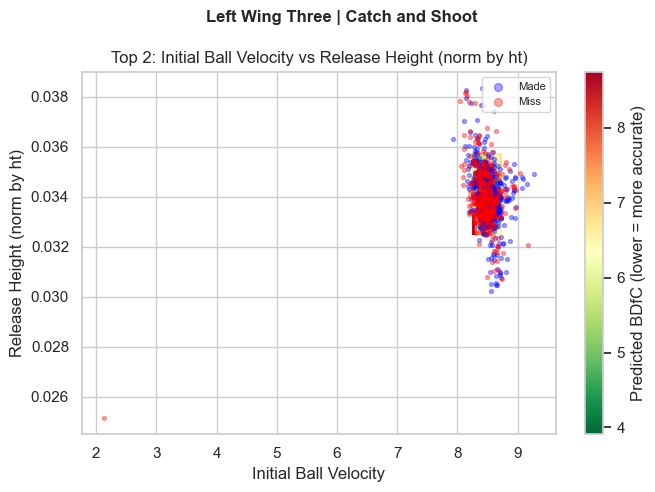


  Left Wing Three | Off the Dribble  (n=544)
  RF R2=0.0381  RMSE=3.046
  Top 2: Release Height (norm by ht)  |  Max Ball Arc (height)


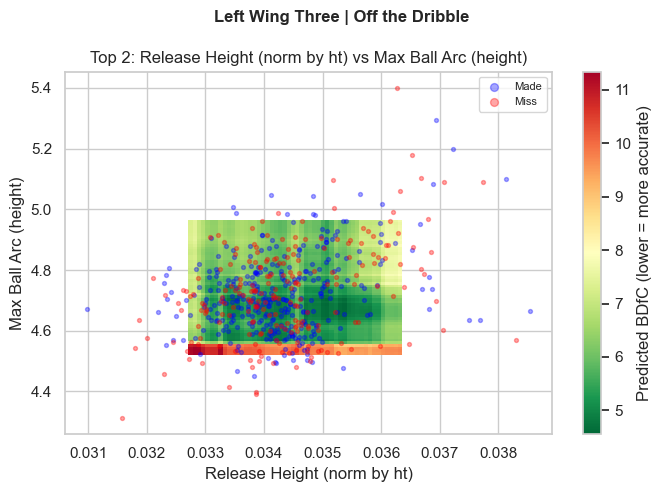


  Middle Two | Catch and Shoot  (n=447)
  RF R2=0.1439  RMSE=2.866
  Top 2: Initial Ball Velocity  |  Release Height (norm by ht)


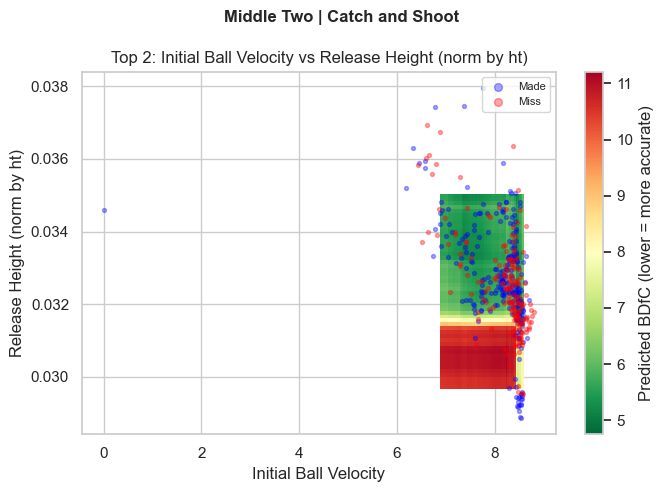

In [132]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import itertools

MIN_N_MODEL = 200
model_results = {}

combos_model = []
for loc in df_clean['Shot.Location'].unique():
    for shot_type in df_clean[df_clean['Shot.Location'] == loc]['Shot.Type'].unique():
        subset = df_clean[
            (df_clean['Shot.Location'] == loc) &
            (df_clean['Shot.Type'] == shot_type)
        ].copy()
        if len(subset) >= MIN_N_MODEL:
            combos_model.append((loc, shot_type, subset))

def make_heatmap(rf_model, subset, pred_x, pred_y, title, ax):
    x_range = np.linspace(subset[pred_x].quantile(0.05), subset[pred_x].quantile(0.95), 50)
    y_range = np.linspace(subset[pred_y].quantile(0.05), subset[pred_y].quantile(0.95), 50)
    xx, yy = np.meshgrid(x_range, y_range)
    medians = subset[PREDICTORS].median()
    grid_df = pd.DataFrame({p: medians[p] for p in PREDICTORS}, index=range(xx.size))
    grid_df[pred_x] = xx.ravel()
    grid_df[pred_y] = yy.ravel()
    z = rf_model.predict(grid_df[PREDICTORS]).reshape(xx.shape)
    pcm = ax.pcolormesh(xx, yy, z, cmap='RdYlGn_r', shading='auto')
    plt.colorbar(pcm, ax=ax, label='Predicted BDfC (lower = more accurate)')
    made_mask = subset['Made'] == True
    ax.scatter(subset.loc[made_mask, pred_x], subset.loc[made_mask, pred_y],
               c='blue', s=8, alpha=0.35, label='Made', zorder=3)
    ax.scatter(subset.loc[~made_mask, pred_x], subset.loc[~made_mask, pred_y],
               c='red', s=8, alpha=0.35, label='Miss', zorder=3)
    ax.set_xlabel(PREDICTOR_LABELS.get(pred_x, pred_x))
    ax.set_ylabel(PREDICTOR_LABELS.get(pred_y, pred_y))
    ax.set_title(title)
    ax.legend(loc='upper right', markerscale=2, fontsize=8)

for loc, shot_type, subset in combos_model:
    label = loc + ' | ' + shot_type
    X_train, X_test, y_train, y_test = train_test_split(
        subset[PREDICTORS], subset[TARGET], test_size=0.2, random_state=42
    )
    rf = RandomForestRegressor(n_estimators=200, random_state=42, n_jobs=-1)
    rf.fit(X_train, y_train)
    y_pred_rf = rf.predict(X_test)
    rf_r2 = r2_score(y_test, y_pred_rf)
    rf_rmse = mean_squared_error(y_test, y_pred_rf) ** 0.5
    importances = pd.Series(rf.feature_importances_, index=PREDICTORS).sort_values(ascending=False)
    top2 = importances.index[:2].tolist()

    model_results[(loc, shot_type)] = {
        'rf': {'r2': rf_r2, 'rmse': rf_rmse, 'model': rf, 'importances': importances},
        'top2': top2,
        'subset': subset,
    }

    print()
    print('=' * 55)
    print('  ' + label + '  (n=' + str(len(subset)) + ')')
    print('=' * 55)
    print('  RF R2=' + str(round(rf_r2, 4)) + '  RMSE=' + str(round(rf_rmse, 3)))
    print('  Top 2: ' + PREDICTOR_LABELS[top2[0]] + '  |  ' + PREDICTOR_LABELS[top2[1]])

    fig, ax = plt.subplots(figsize=(7, 5))
    fig.suptitle(label, fontsize=12, fontweight='bold')
    make_heatmap(rf, subset, top2[0], top2[1],
                 'Top 2: ' + PREDICTOR_LABELS[top2[0]] + ' vs ' + PREDICTOR_LABELS[top2[1]], ax)
    plt.tight_layout()
    plt.show()


### Section 2 Summary: Top Predictors Across Locations

In [133]:
summary_rows = []
for (loc, shot_type), res in model_results.items():
    imp = res['rf']['importances']
    summary_rows.append({
        'Location': loc,
        'Shot Type': shot_type,
        'n': len(res['subset']),
        'RF R2': round(res['rf']['r2'], 4),
        'RF RMSE': round(res['rf']['rmse'], 3),
        'Top Predictor': PREDICTOR_LABELS[imp.index[0]],
        '2nd Predictor': PREDICTOR_LABELS[imp.index[1]],
    })

summary_df = pd.DataFrame(summary_rows).sort_values(['Location', 'Shot Type'])
print(summary_df.to_string(index=False))
summary_df


          Location       Shot Type    n   RF R2  RF RMSE               Top Predictor               2nd Predictor
        Free Throw             All 3794  0.1592    2.255       Initial Ball Velocity               Ball Velocity
               Key Catch and Shoot  510  0.1286    3.892 Release Height (norm by ht)       Initial Ball Velocity
               Key Off the Dribble 1286  0.0495    3.872               Ball Velocity       Initial Ball Velocity
 Left Corner Three Catch and Shoot  950 -0.0864    3.009               Ball Velocity       Initial Ball Velocity
 Left Corner Three Off the Dribble 3882  0.1238    2.728               Ball Velocity       Initial Ball Velocity
   Left Corner Two Catch and Shoot  261  0.0700    3.873               Ball Velocity          Initial Ball Angle
   Left Corner Two Off the Dribble  327  0.1961    5.740       Initial Ball Velocity Release Height (norm by ht)
   Left Wing Three Catch and Shoot 1022 -0.0030    2.818       Initial Ball Velocity Release Hei

,Location,Shot Type,n,RF R2,RF RMSE,Top Predictor,2nd Predictor
6,Free Throw,All,3794,0.1592,2.255,Initial Ball Velocity,Ball Velocity
8,Key,Catch and Shoot,510,0.1286,3.892,Release Height (norm by ht),Initial Ball Velocity
7,Key,Off the Dribble,1286,0.0495,3.872,Ball Velocity,Initial Ball Velocity
1,Left Corner Three,Catch and Shoot,950,-0.0864,3.009,Ball Velocity,Initial Ball Velocity
0,Left Corner Three,Off the Dribble,3882,0.1238,2.728,Ball Velocity,Initial Ball Velocity
12,Left Corner Two,Catch and Shoot,261,0.0700,3.873,Ball Velocity,Initial Ball Angle
11,Left Corner Two,Off the Dribble,327,0.1961,5.740,Initial Ball Velocity,Release Height (norm by ht)
15,Left Wing Three,Catch and Shoot,1022,-0.0030,2.818,Initial Ball Velocity,Release Height (norm by ht)
16,Left Wing Three,Off the Dribble,544,0.0381,3.046,Release Height (norm by ht),Max Ball Arc (height)
4,Middle Three,Catch and Shoot,4130,0.1445,3.178,Initial Ball Velocity,Release Height (norm by ht)


## Section 3: All Pairwise Heatmaps and Ideal Ranges -- Per Shot Location x Shot Type

For each Location x Shot Type combination, generate all 15 pairwise 2D heatmaps
(every combination of the 6 predictors taken 2 at a time).

For each pair, the **ideal 2D range** is extracted from the optimal shots
(bottom 25% of predicted BDfC from real observed shots -- same method as Section 6).
This gives the joint feasible range for each pair of variables simultaneously.


  Left Corner Three | Off the Dribble  (n=3882, optimal shots=971)


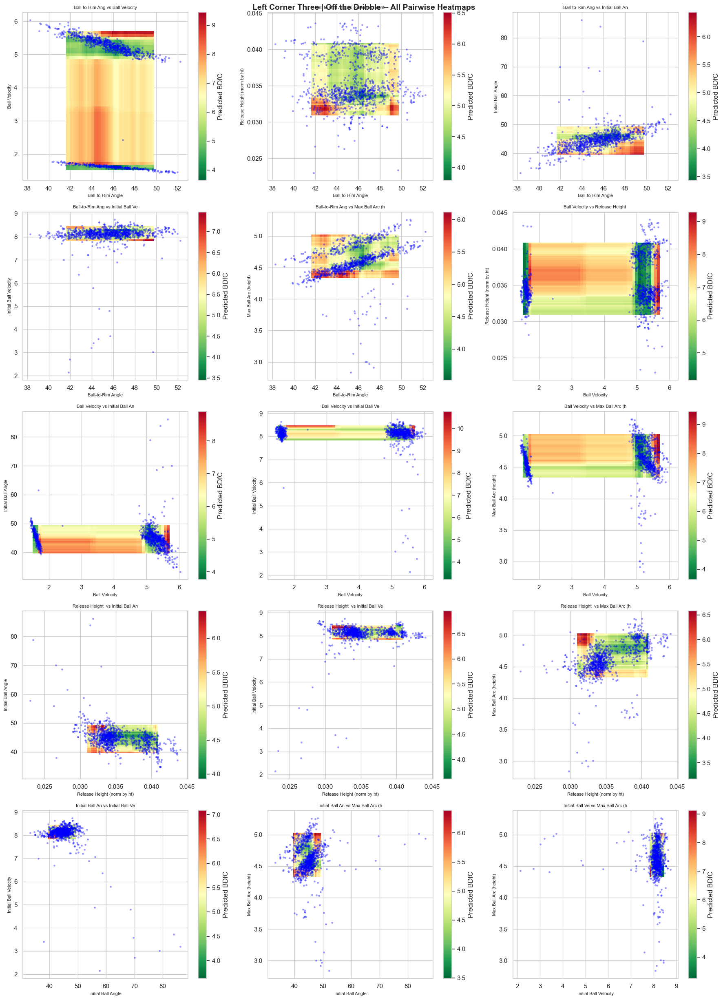

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               38.28 - 52.23         1.433 - 6.037
  Ball-to-Rim Angle vs Release Height (norm by ht)                 38.28 - 52.23         0.023 - 0.044
  Ball-to-Rim Angle vs Initial Ball Angle                          38.28 - 52.23         33.27 - 86.178
  Ball-to-Rim Angle vs Initial Ball Velocity                       38.28 - 52.23         2.144 - 8.745
  Ball-to-Rim Angle vs Max Ball Arc (height)                       38.28 - 52.23         2.837 - 5.263
  Ball Velocity vs Release Height (norm by ht)                     1.433 - 6.037         0.023 - 0.044
  Ball Velocity vs Initial Ball Angle                              1.433 - 6.037         33.27 - 86.178
  Ball Velocity vs Initial Ball Veloc

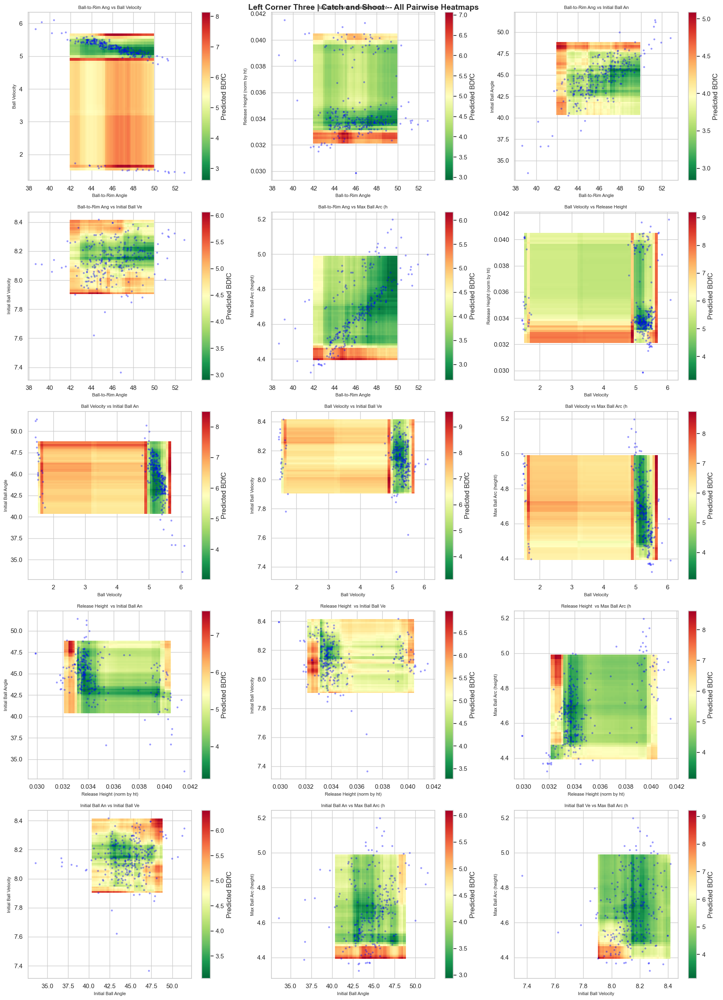

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               38.63 - 52.84         1.443 - 6.101
  Ball-to-Rim Angle vs Release Height (norm by ht)                 38.63 - 52.84         0.03 - 0.042
  Ball-to-Rim Angle vs Initial Ball Angle                          38.63 - 52.84         33.586 - 51.423
  Ball-to-Rim Angle vs Initial Ball Velocity                       38.63 - 52.84         7.365 - 8.418
  Ball-to-Rim Angle vs Max Ball Arc (height)                       38.63 - 52.84         4.324 - 5.198
  Ball Velocity vs Release Height (norm by ht)                     1.443 - 6.101         0.03 - 0.042
  Ball Velocity vs Initial Ball Angle                              1.443 - 6.101         33.586 - 51.423
  Ball Velocity vs Initial Ball Veloc

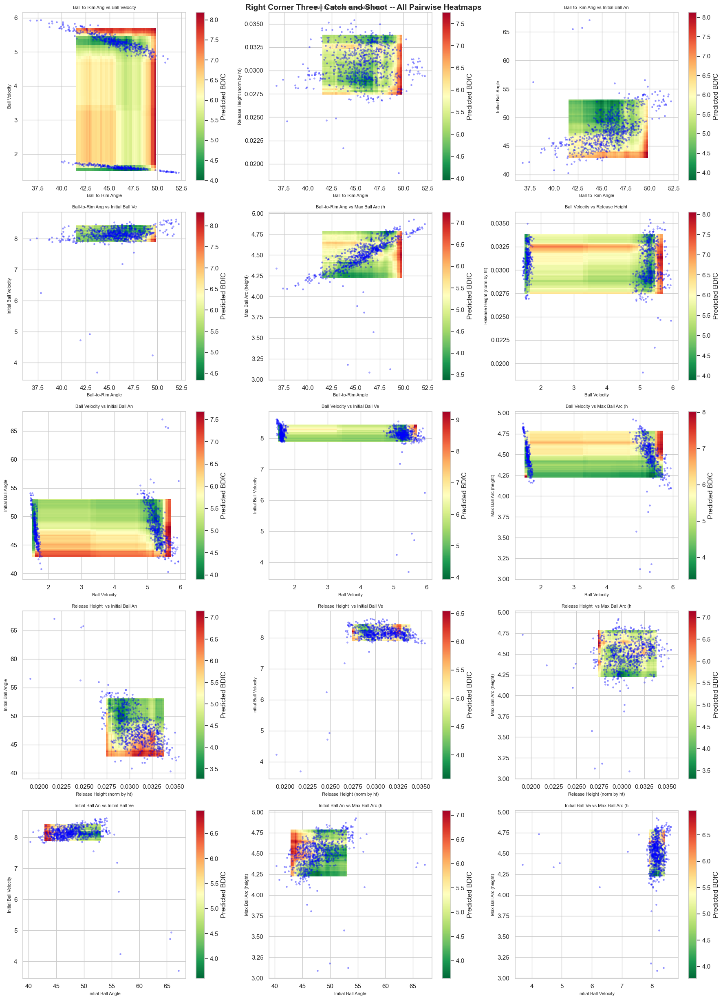

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               36.71 - 52.19         1.449 - 5.936
  Ball-to-Rim Angle vs Release Height (norm by ht)                 36.71 - 52.19         0.019 - 0.035
  Ball-to-Rim Angle vs Initial Ball Angle                          36.71 - 52.19         40.298 - 67.092
  Ball-to-Rim Angle vs Initial Ball Velocity                       36.71 - 52.19         3.692 - 8.621
  Ball-to-Rim Angle vs Max Ball Arc (height)                       36.71 - 52.19         3.087 - 4.927
  Ball Velocity vs Release Height (norm by ht)                     1.449 - 5.936         0.019 - 0.035
  Ball Velocity vs Initial Ball Angle                              1.449 - 5.936         40.298 - 67.092
  Ball Velocity vs Initial Ball Vel

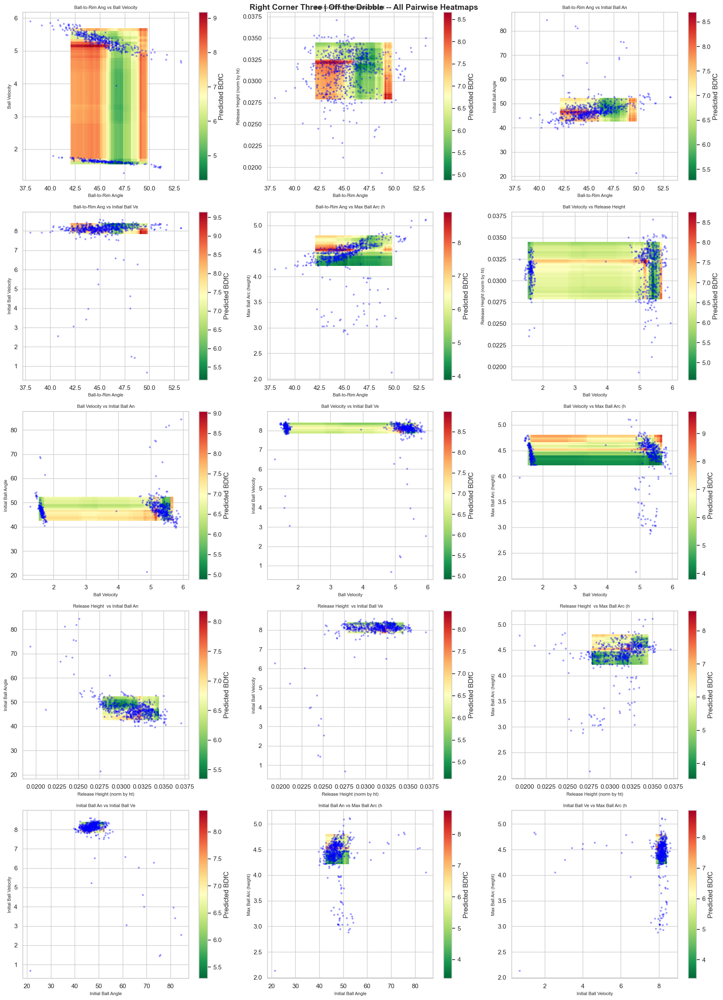

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               37.99 - 53.2          1.282 - 5.942
  Ball-to-Rim Angle vs Release Height (norm by ht)                 37.99 - 53.2          0.019 - 0.037
  Ball-to-Rim Angle vs Initial Ball Angle                          37.99 - 53.2          21.409 - 84.485
  Ball-to-Rim Angle vs Initial Ball Velocity                       37.99 - 53.2          0.678 - 8.594
  Ball-to-Rim Angle vs Max Ball Arc (height)                       37.99 - 53.2          2.13 - 5.115
  Ball Velocity vs Release Height (norm by ht)                     1.282 - 5.942         0.019 - 0.037
  Ball Velocity vs Initial Ball Angle                              1.282 - 5.942         21.409 - 84.485
  Ball Velocity vs Initial Ball Velo

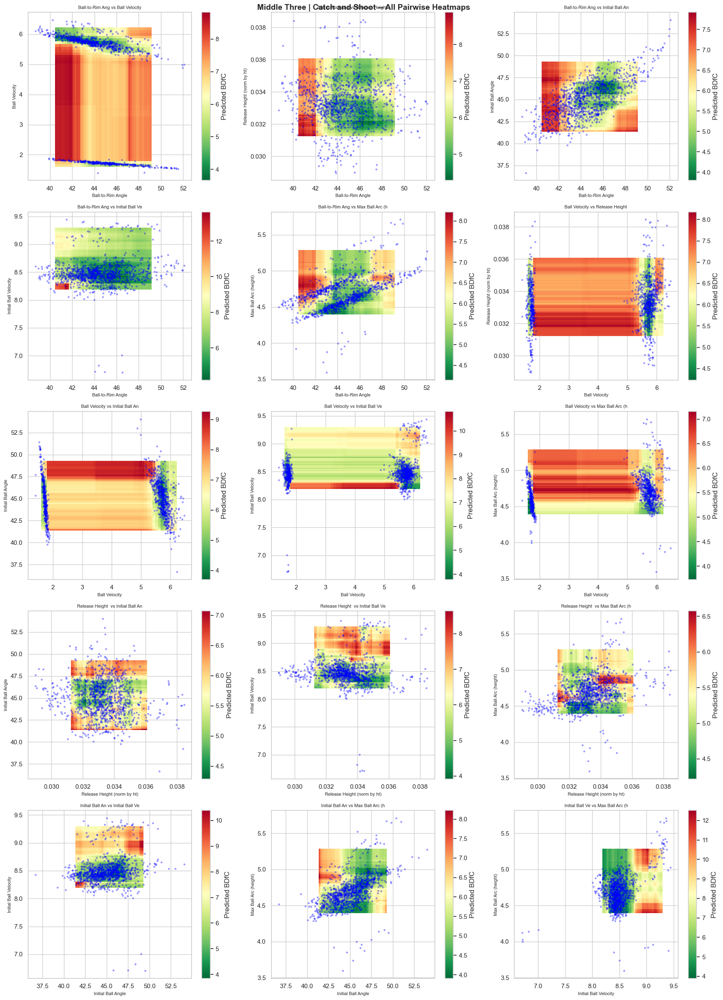

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               38.69 - 52.08         1.401 - 6.472
  Ball-to-Rim Angle vs Release Height (norm by ht)                 38.69 - 52.08         0.029 - 0.038
  Ball-to-Rim Angle vs Initial Ball Angle                          38.69 - 52.08         36.663 - 54.039
  Ball-to-Rim Angle vs Initial Ball Velocity                       38.69 - 52.08         6.703 - 9.444
  Ball-to-Rim Angle vs Max Ball Arc (height)                       38.69 - 52.08         3.594 - 5.711
  Ball Velocity vs Release Height (norm by ht)                     1.401 - 6.472         0.029 - 0.038
  Ball Velocity vs Initial Ball Angle                              1.401 - 6.472         36.663 - 54.039
  Ball Velocity vs Initial Ball Vel

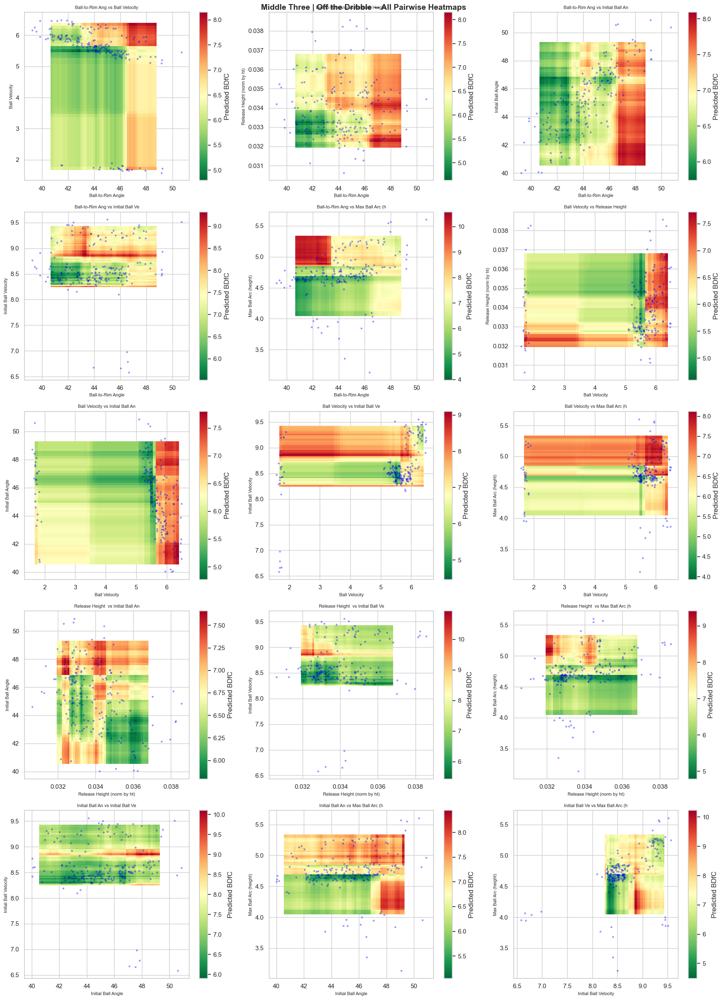

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               39.23 - 50.71         1.583 - 6.489
  Ball-to-Rim Angle vs Release Height (norm by ht)                 39.23 - 50.71         0.031 - 0.039
  Ball-to-Rim Angle vs Initial Ball Angle                          39.23 - 50.71         40.018 - 50.883
  Ball-to-Rim Angle vs Initial Ball Velocity                       39.23 - 50.71         6.581 - 9.559
  Ball-to-Rim Angle vs Max Ball Arc (height)                       39.23 - 50.71         3.134 - 5.603
  Ball Velocity vs Release Height (norm by ht)                     1.583 - 6.489         0.031 - 0.039
  Ball Velocity vs Initial Ball Angle                              1.583 - 6.489         40.018 - 50.883
  Ball Velocity vs Initial Ball Vel

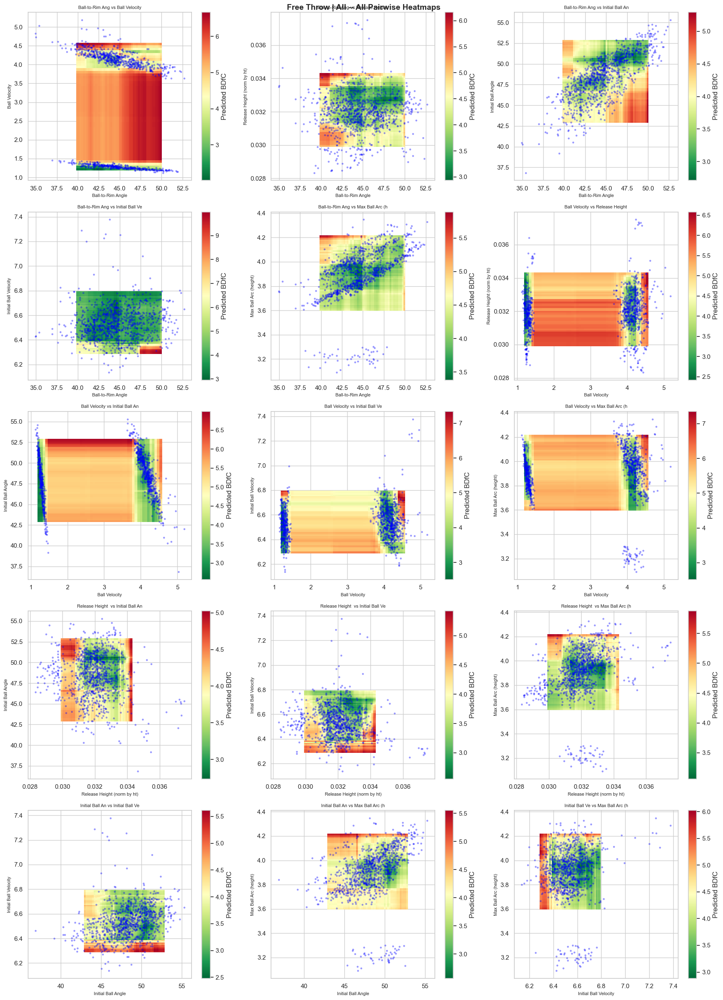

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               34.94 - 52.69         1.123 - 5.185
  Ball-to-Rim Angle vs Release Height (norm by ht)                 34.94 - 52.69         0.028 - 0.038
  Ball-to-Rim Angle vs Initial Ball Angle                          34.94 - 52.69         36.841 - 55.302
  Ball-to-Rim Angle vs Initial Ball Velocity                       34.94 - 52.69         6.137 - 7.378
  Ball-to-Rim Angle vs Max Ball Arc (height)                       34.94 - 52.69         3.091 - 4.348
  Ball Velocity vs Release Height (norm by ht)                     1.123 - 5.185         0.028 - 0.038
  Ball Velocity vs Initial Ball Angle                              1.123 - 5.185         36.841 - 55.302
  Ball Velocity vs Initial Ball Vel

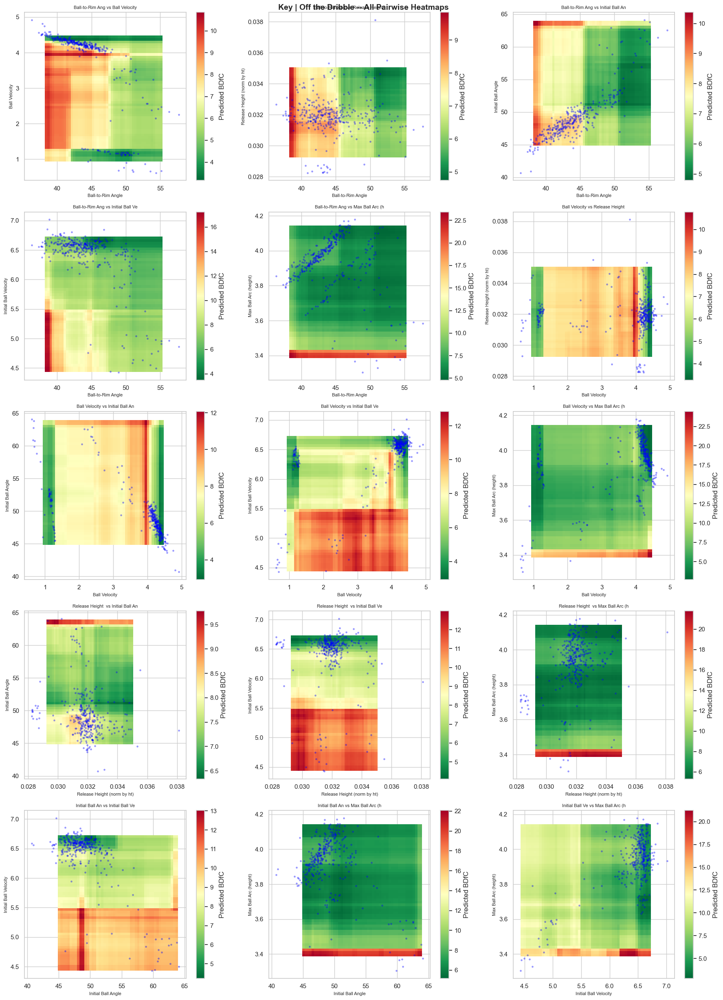

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               36.31 - 57.69         0.619 - 4.918
  Ball-to-Rim Angle vs Release Height (norm by ht)                 36.31 - 57.69         0.028 - 0.038
  Ball-to-Rim Angle vs Initial Ball Angle                          36.31 - 57.69         40.702 - 64.102
  Ball-to-Rim Angle vs Initial Ball Velocity                       36.31 - 57.69         4.428 - 7.017
  Ball-to-Rim Angle vs Max Ball Arc (height)                       36.31 - 57.69         3.304 - 4.179
  Ball Velocity vs Release Height (norm by ht)                     0.619 - 4.918         0.028 - 0.038
  Ball Velocity vs Initial Ball Angle                              0.619 - 4.918         40.702 - 64.102
  Ball Velocity vs Initial Ball Vel

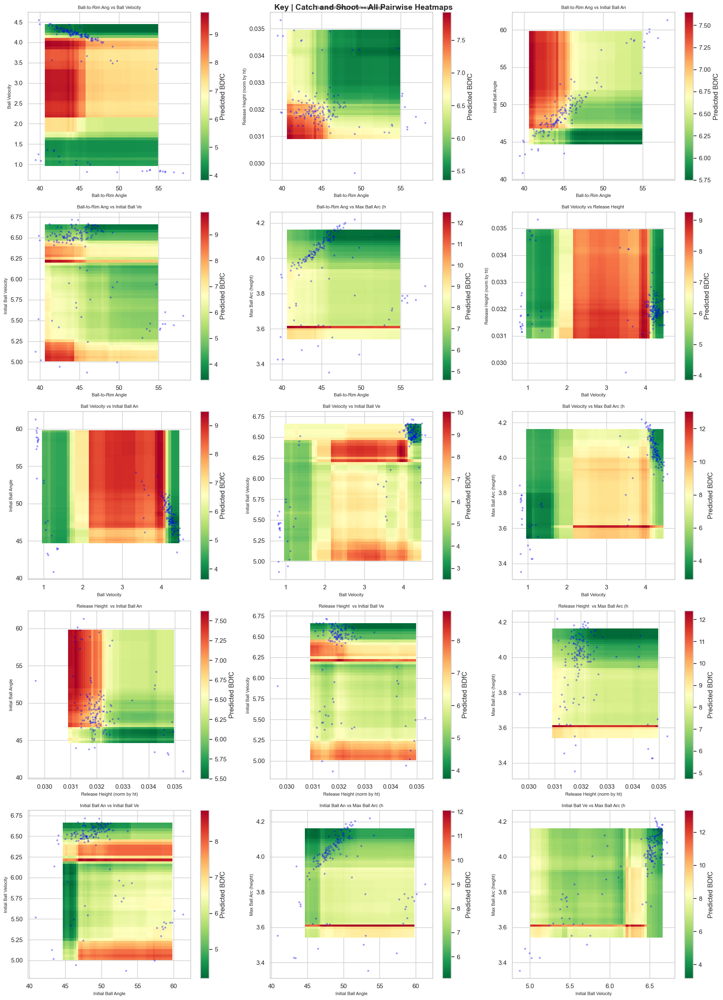

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               39.43 - 58.13         0.796 - 4.549
  Ball-to-Rim Angle vs Release Height (norm by ht)                 39.43 - 58.13         0.03 - 0.035
  Ball-to-Rim Angle vs Initial Ball Angle                          39.43 - 58.13         40.846 - 61.326
  Ball-to-Rim Angle vs Initial Ball Velocity                       39.43 - 58.13         4.874 - 6.719
  Ball-to-Rim Angle vs Max Ball Arc (height)                       39.43 - 58.13         3.353 - 4.22
  Ball Velocity vs Release Height (norm by ht)                     0.796 - 4.549         0.03 - 0.035
  Ball Velocity vs Initial Ball Angle                              0.796 - 4.549         40.846 - 61.326
  Ball Velocity vs Initial Ball Veloci

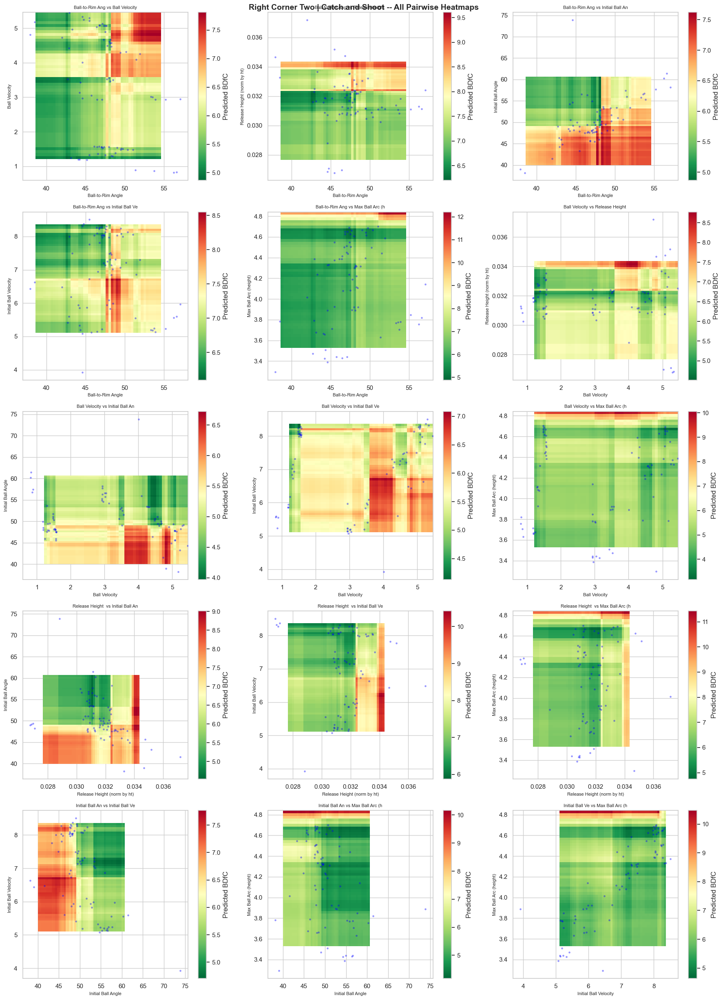

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               37.96 - 57.09         0.821 - 5.452
  Ball-to-Rim Angle vs Release Height (norm by ht)                 37.96 - 57.09         0.027 - 0.037
  Ball-to-Rim Angle vs Initial Ball Angle                          37.96 - 57.09         38.197 - 73.895
  Ball-to-Rim Angle vs Initial Ball Velocity                       37.96 - 57.09         3.923 - 8.509
  Ball-to-Rim Angle vs Max Ball Arc (height)                       37.96 - 57.09         3.295 - 4.702
  Ball Velocity vs Release Height (norm by ht)                     0.821 - 5.452         0.027 - 0.037
  Ball Velocity vs Initial Ball Angle                              0.821 - 5.452         38.197 - 73.895
  Ball Velocity vs Initial Ball Vel

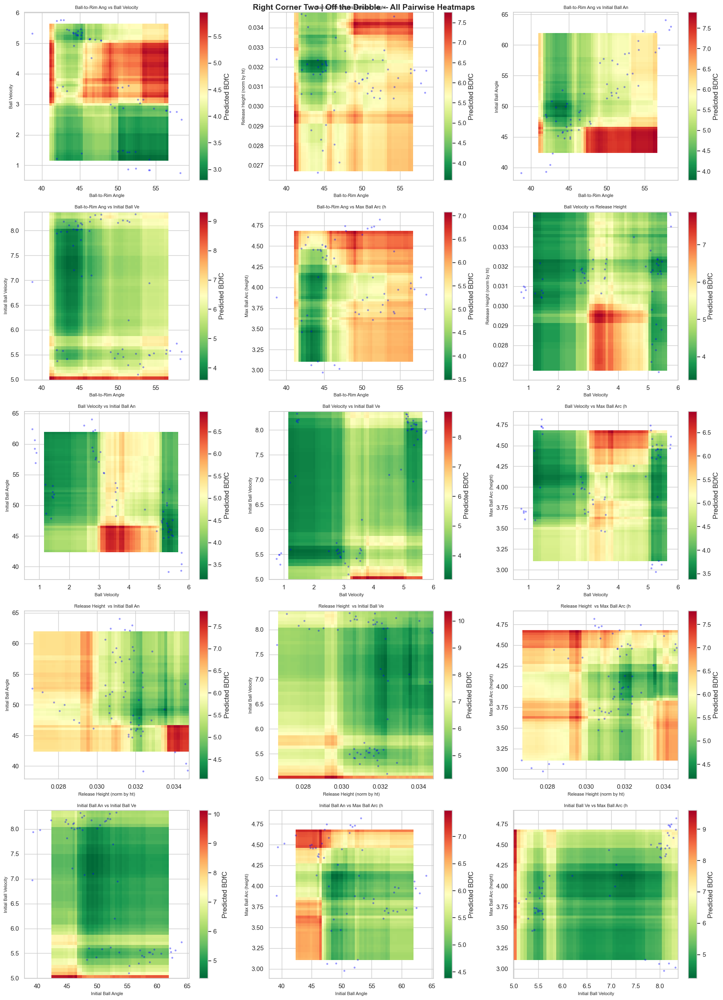

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               38.7 - 58.43          0.756 - 5.76
  Ball-to-Rim Angle vs Release Height (norm by ht)                 38.7 - 58.43          0.027 - 0.035
  Ball-to-Rim Angle vs Initial Ball Angle                          38.7 - 58.43          39.144 - 64.072
  Ball-to-Rim Angle vs Initial Ball Velocity                       38.7 - 58.43          5.102 - 8.332
  Ball-to-Rim Angle vs Max Ball Arc (height)                       38.7 - 58.43          2.976 - 4.821
  Ball Velocity vs Release Height (norm by ht)                     0.756 - 5.76          0.027 - 0.035
  Ball Velocity vs Initial Ball Angle                              0.756 - 5.76          39.144 - 64.072
  Ball Velocity vs Initial Ball Velo

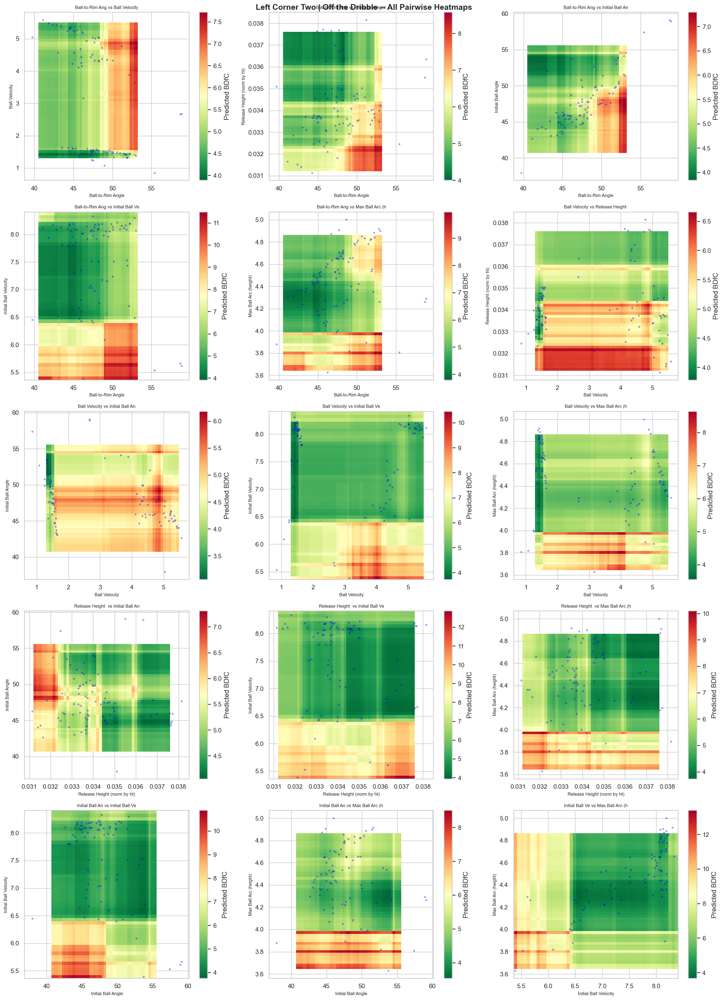

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               39.7 - 58.87          0.851 - 5.576
  Ball-to-Rim Angle vs Release Height (norm by ht)                 39.7 - 58.87          0.031 - 0.038
  Ball-to-Rim Angle vs Initial Ball Angle                          39.7 - 58.87          37.932 - 59.117
  Ball-to-Rim Angle vs Initial Ball Velocity                       39.7 - 58.87          5.389 - 8.332
  Ball-to-Rim Angle vs Max Ball Arc (height)                       39.7 - 58.87          3.628 - 5.001
  Ball Velocity vs Release Height (norm by ht)                     0.851 - 5.576         0.031 - 0.038
  Ball Velocity vs Initial Ball Angle                              0.851 - 5.576         37.932 - 59.117
  Ball Velocity vs Initial Ball Vel

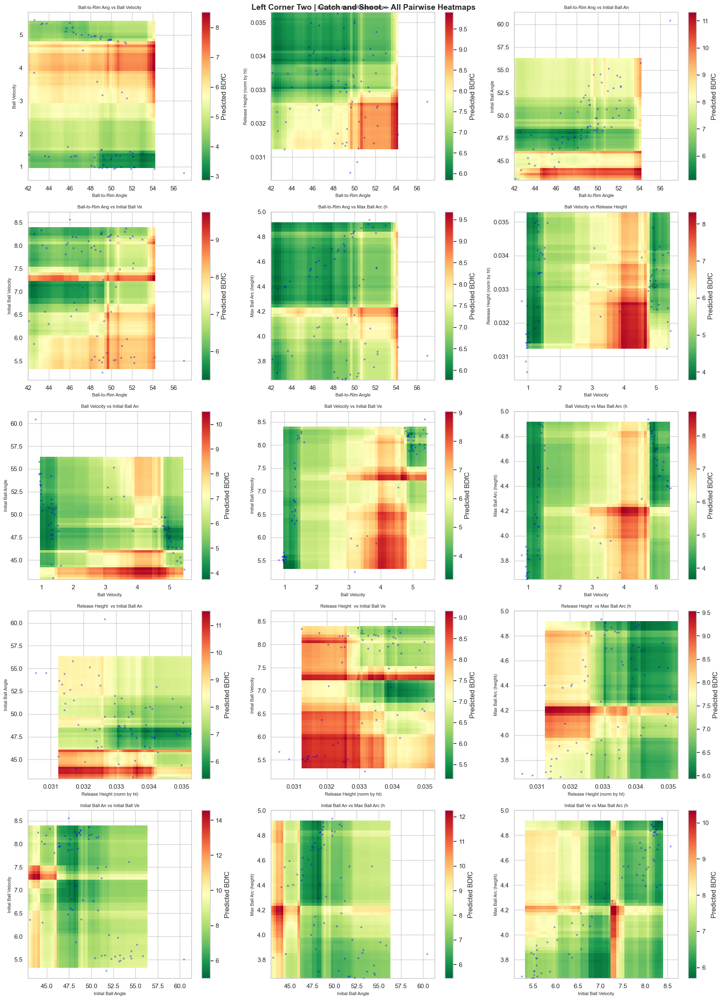

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               42.08 - 56.97         0.815 - 5.456
  Ball-to-Rim Angle vs Release Height (norm by ht)                 42.08 - 56.97         0.031 - 0.035
  Ball-to-Rim Angle vs Initial Ball Angle                          42.08 - 56.97         43.056 - 60.444
  Ball-to-Rim Angle vs Initial Ball Velocity                       42.08 - 56.97         5.255 - 8.563
  Ball-to-Rim Angle vs Max Ball Arc (height)                       42.08 - 56.97         3.649 - 4.936
  Ball Velocity vs Release Height (norm by ht)                     0.815 - 5.456         0.031 - 0.035
  Ball Velocity vs Initial Ball Angle                              0.815 - 5.456         43.056 - 60.444
  Ball Velocity vs Initial Ball Vel

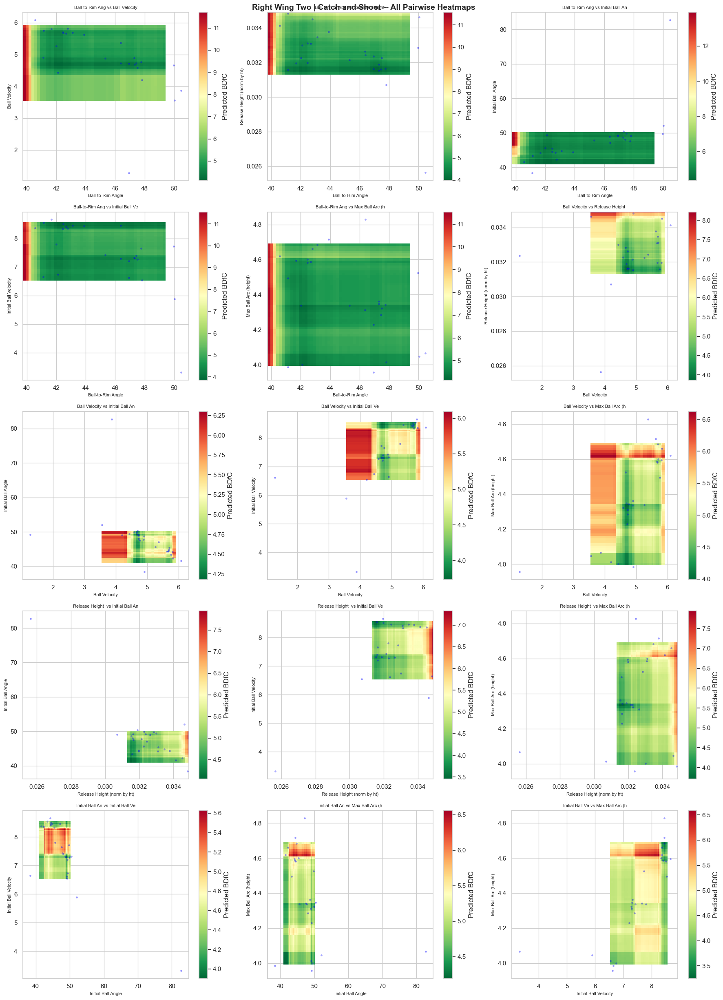

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               40.57 - 50.46         1.28 - 6.087
  Ball-to-Rim Angle vs Release Height (norm by ht)                 40.57 - 50.46         0.026 - 0.035
  Ball-to-Rim Angle vs Initial Ball Angle                          40.57 - 50.46         38.413 - 82.759
  Ball-to-Rim Angle vs Initial Ball Velocity                       40.57 - 50.46         3.316 - 8.662
  Ball-to-Rim Angle vs Max Ball Arc (height)                       40.57 - 50.46         3.957 - 4.828
  Ball Velocity vs Release Height (norm by ht)                     1.28 - 6.087          0.026 - 0.035
  Ball Velocity vs Initial Ball Angle                              1.28 - 6.087          38.413 - 82.759
  Ball Velocity vs Initial Ball Velo

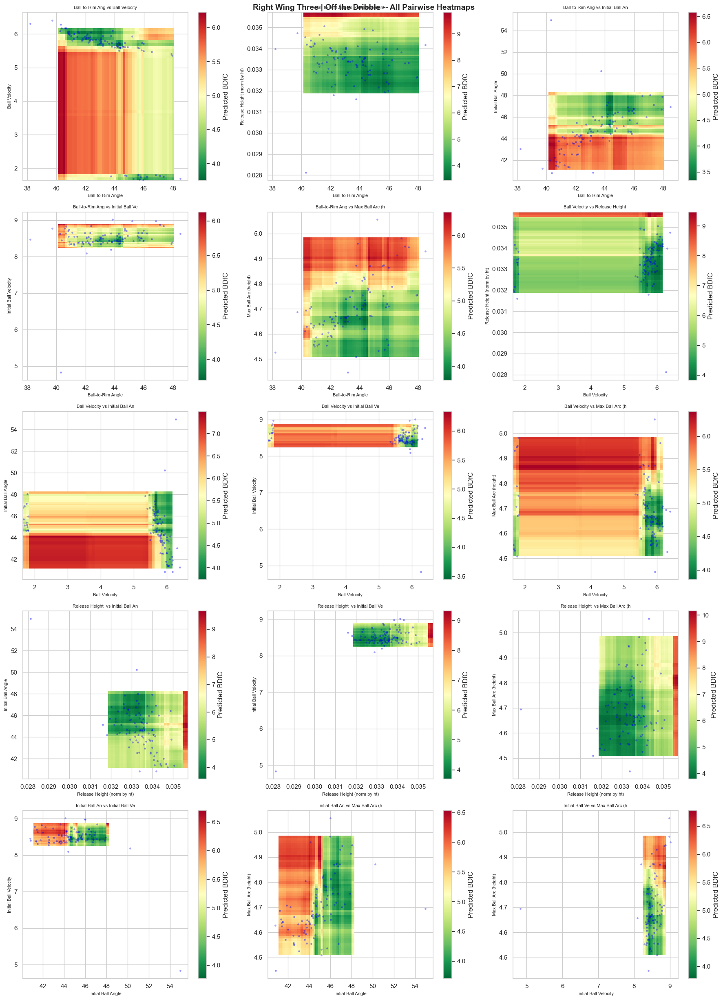

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               38.21 - 48.5          1.656 - 6.403
  Ball-to-Rim Angle vs Release Height (norm by ht)                 38.21 - 48.5          0.028 - 0.035
  Ball-to-Rim Angle vs Initial Ball Angle                          38.21 - 48.5          40.828 - 54.962
  Ball-to-Rim Angle vs Initial Ball Velocity                       38.21 - 48.5          4.83 - 9.016
  Ball-to-Rim Angle vs Max Ball Arc (height)                       38.21 - 48.5          4.447 - 5.056
  Ball Velocity vs Release Height (norm by ht)                     1.656 - 6.403         0.028 - 0.035
  Ball Velocity vs Initial Ball Angle                              1.656 - 6.403         40.828 - 54.962
  Ball Velocity vs Initial Ball Velo

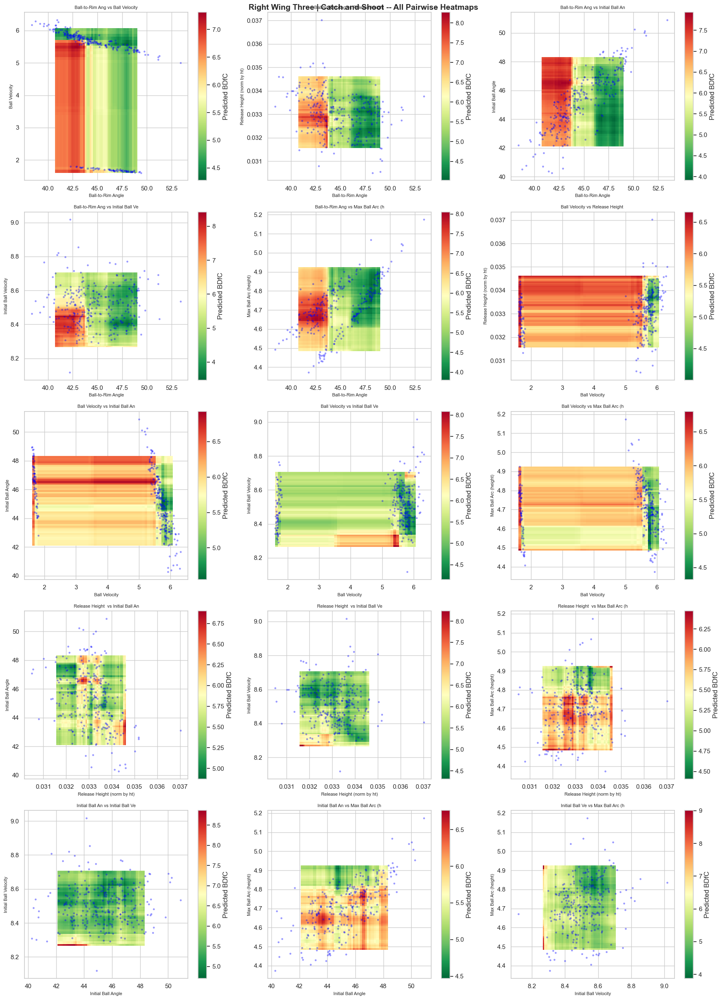

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               38.39 - 53.41         1.605 - 6.323
  Ball-to-Rim Angle vs Release Height (norm by ht)                 38.39 - 53.41         0.031 - 0.037
  Ball-to-Rim Angle vs Initial Ball Angle                          38.39 - 53.41         40.27 - 50.894
  Ball-to-Rim Angle vs Initial Ball Velocity                       38.39 - 53.41         8.118 - 9.017
  Ball-to-Rim Angle vs Max Ball Arc (height)                       38.39 - 53.41         4.373 - 5.175
  Ball Velocity vs Release Height (norm by ht)                     1.605 - 6.323         0.031 - 0.037
  Ball Velocity vs Initial Ball Angle                              1.605 - 6.323         40.27 - 50.894
  Ball Velocity vs Initial Ball Veloc

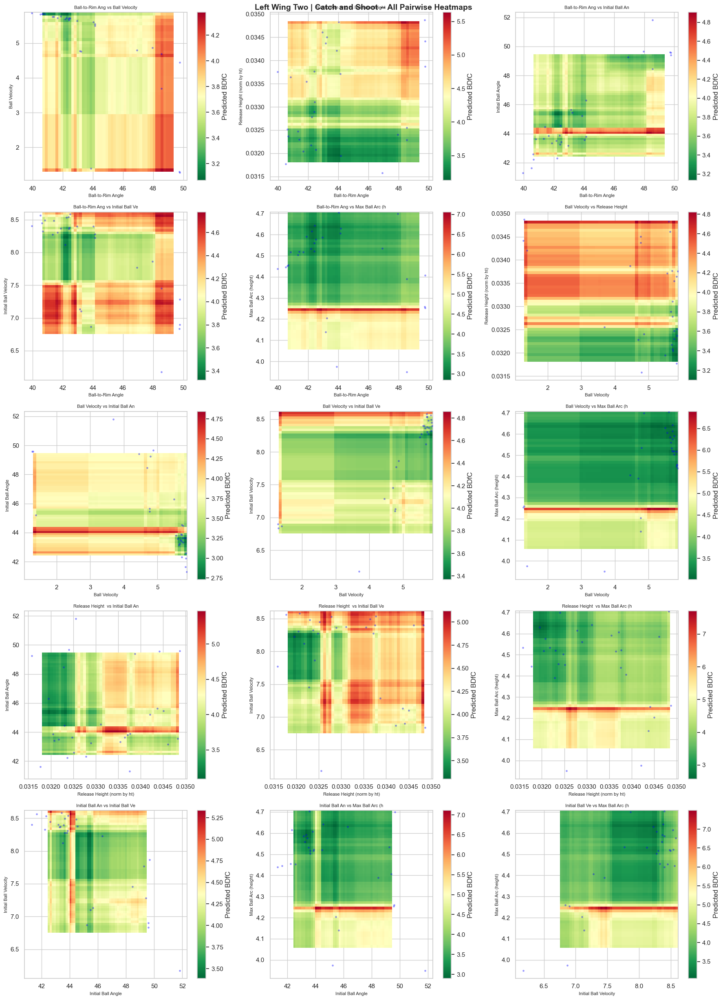

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               39.95 - 49.77         1.28 - 5.87
  Ball-to-Rim Angle vs Release Height (norm by ht)                 39.95 - 49.77         0.032 - 0.035
  Ball-to-Rim Angle vs Initial Ball Angle                          39.95 - 49.77         41.303 - 51.816
  Ball-to-Rim Angle vs Initial Ball Velocity                       39.95 - 49.77         6.176 - 8.582
  Ball-to-Rim Angle vs Max Ball Arc (height)                       39.95 - 49.77         3.95 - 4.705
  Ball Velocity vs Release Height (norm by ht)                     1.28 - 5.87           0.032 - 0.035
  Ball Velocity vs Initial Ball Angle                              1.28 - 5.87           41.303 - 51.816
  Ball Velocity vs Initial Ball Veloci

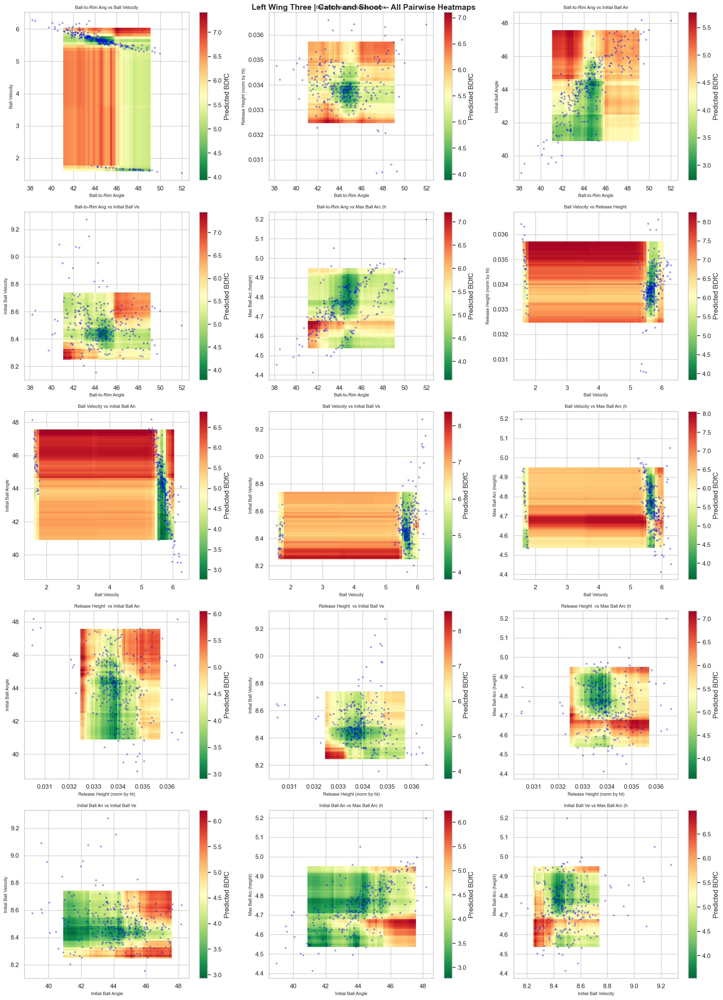

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               38.19 - 51.98         1.547 - 6.279
  Ball-to-Rim Angle vs Release Height (norm by ht)                 38.19 - 51.98         0.03 - 0.037
  Ball-to-Rim Angle vs Initial Ball Angle                          38.19 - 51.98         38.97 - 48.194
  Ball-to-Rim Angle vs Initial Ball Velocity                       38.19 - 51.98         8.156 - 9.273
  Ball-to-Rim Angle vs Max Ball Arc (height)                       38.19 - 51.98         4.413 - 5.199
  Ball Velocity vs Release Height (norm by ht)                     1.547 - 6.279         0.03 - 0.037
  Ball Velocity vs Initial Ball Angle                              1.547 - 6.279         38.97 - 48.194
  Ball Velocity vs Initial Ball Velocit

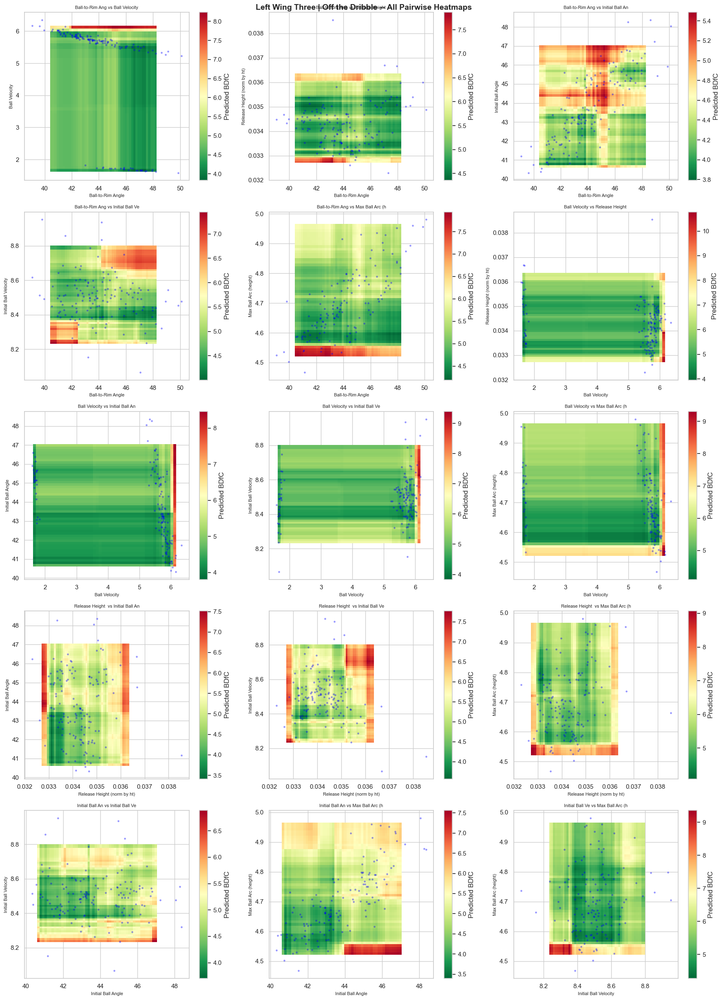

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               39.06 - 50.11         1.585 - 6.346
  Ball-to-Rim Angle vs Release Height (norm by ht)                 39.06 - 50.11         0.032 - 0.039
  Ball-to-Rim Angle vs Initial Ball Angle                          39.06 - 50.11         40.325 - 48.37
  Ball-to-Rim Angle vs Initial Ball Velocity                       39.06 - 50.11         8.066 - 8.952
  Ball-to-Rim Angle vs Max Ball Arc (height)                       39.06 - 50.11         4.467 - 4.981
  Ball Velocity vs Release Height (norm by ht)                     1.585 - 6.346         0.032 - 0.039
  Ball Velocity vs Initial Ball Angle                              1.585 - 6.346         40.325 - 48.37
  Ball Velocity vs Initial Ball Veloc

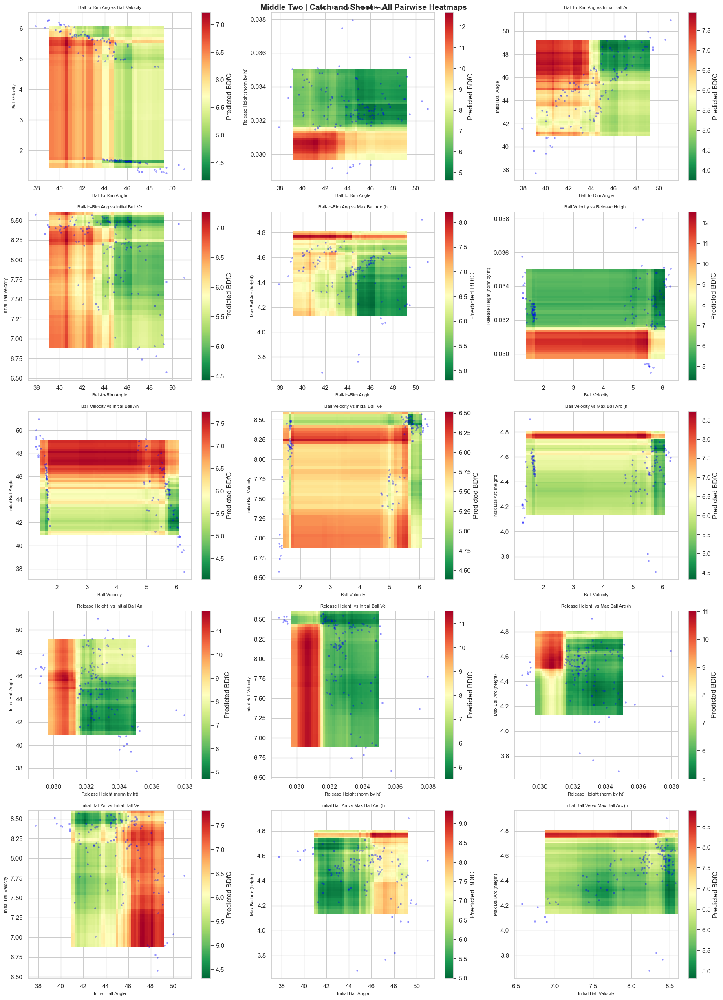

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               37.88 - 51.04         1.274 - 6.266
  Ball-to-Rim Angle vs Release Height (norm by ht)                 37.88 - 51.04         0.029 - 0.038
  Ball-to-Rim Angle vs Initial Ball Angle                          37.88 - 51.04         37.735 - 50.977
  Ball-to-Rim Angle vs Initial Ball Velocity                       37.88 - 51.04         6.581 - 8.573
  Ball-to-Rim Angle vs Max Ball Arc (height)                       37.88 - 51.04         3.677 - 4.904
  Ball Velocity vs Release Height (norm by ht)                     1.274 - 6.266         0.029 - 0.038
  Ball Velocity vs Initial Ball Angle                              1.274 - 6.266         37.735 - 50.977
  Ball Velocity vs Initial Ball Vel

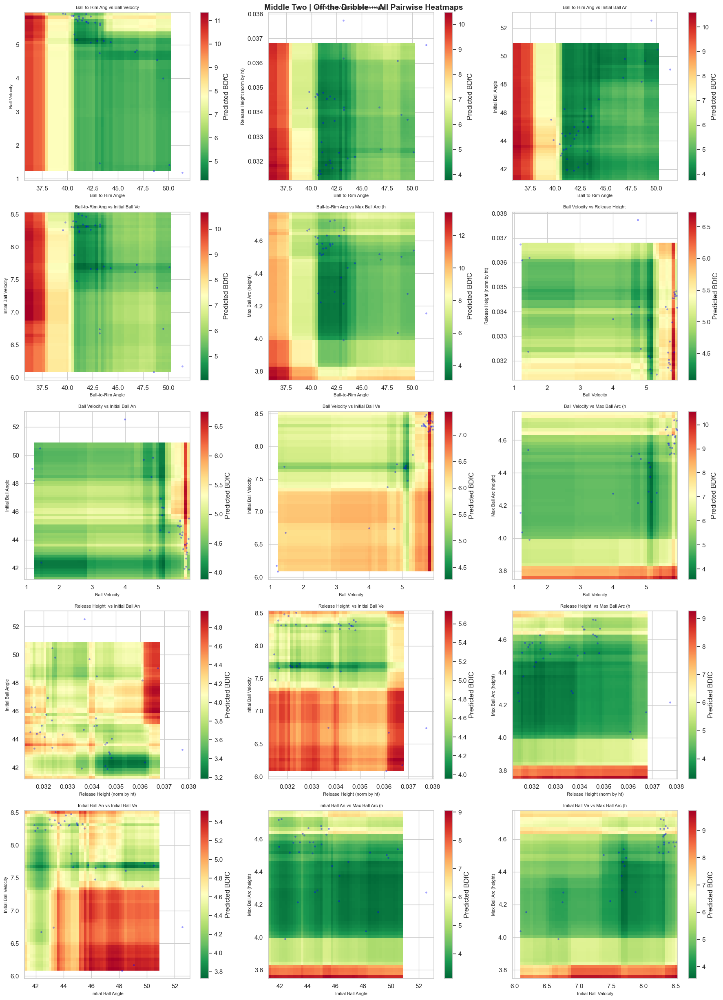

  2D Ideal Ranges (from optimal shots):
  Pair                                                             X range               Y range
  ----------------------------------------------------------------------------------------------------
  Ball-to-Rim Angle vs Ball Velocity                               39.56 - 51.36         1.188 - 5.935
  Ball-to-Rim Angle vs Release Height (norm by ht)                 39.56 - 51.36         0.031 - 0.038
  Ball-to-Rim Angle vs Initial Ball Angle                          39.56 - 51.36         41.905 - 52.536
  Ball-to-Rim Angle vs Initial Ball Velocity                       39.56 - 51.36         6.086 - 8.509
  Ball-to-Rim Angle vs Max Ball Arc (height)                       39.56 - 51.36         3.991 - 4.724
  Ball Velocity vs Release Height (norm by ht)                     1.188 - 5.935         0.031 - 0.038
  Ball Velocity vs Initial Ball Angle                              1.188 - 5.935         41.905 - 52.536
  Ball Velocity vs Initial Ball Vel

In [134]:
from itertools import combinations

MIN_N_SEC3 = 100
OPTIMAL_PERCENTILE_SEC3 = 25
ALL_PAIRS = list(combinations(PREDICTORS, 2))

all_pair_ranges = []

combos_sec3 = []
for loc in df_clean['Shot.Location'].unique():
    for shot_type in df_clean[df_clean['Shot.Location'] == loc]['Shot.Type'].unique():
        subset = df_clean[
            (df_clean['Shot.Location'] == loc) &
            (df_clean['Shot.Type'] == shot_type)
        ].copy()
        if len(subset) >= MIN_N_SEC3:
            combos_sec3.append((loc, shot_type, subset))

for loc, shot_type, subset in combos_sec3:
    label = loc + ' | ' + shot_type
    n = len(subset)

    # Fit RF on all 6 predictors
    rf = RandomForestRegressor(n_estimators=200, random_state=42, n_jobs=-1)
    rf.fit(subset[PREDICTORS], subset[TARGET])

    # Identify optimal shots (bottom 25% predicted BDfC)
    subset = subset.copy()
    subset['predicted_BDfC'] = rf.predict(subset[PREDICTORS])
    threshold = subset['predicted_BDfC'].quantile(OPTIMAL_PERCENTILE_SEC3 / 100)
    optimal = subset[subset['predicted_BDfC'] <= threshold]

    importances = pd.Series(rf.feature_importances_, index=PREDICTORS).sort_values(ascending=False)

    print()
    print('=' * 70)
    print('  ' + label + '  (n=' + str(n) + ', optimal shots=' + str(len(optimal)) + ')')
    print('=' * 70)

    # Plot all 15 heatmaps in a 5x3 grid
    ncols = 3
    nrows = 5
    fig, axes = plt.subplots(nrows, ncols, figsize=(18, 25))
    fig.suptitle(label + ' -- All Pairwise Heatmaps', fontsize=14, fontweight='bold')
    axes_flat = axes.flatten()

    for idx, (px, py) in enumerate(ALL_PAIRS):
        ax = axes_flat[idx]
        x_range = np.linspace(subset[px].quantile(0.05), subset[px].quantile(0.95), 50)
        y_range = np.linspace(subset[py].quantile(0.05), subset[py].quantile(0.95), 50)
        xx, yy = np.meshgrid(x_range, y_range)
        medians = subset[PREDICTORS].median()
        grid_df = pd.DataFrame({p: medians[p] for p in PREDICTORS}, index=range(xx.size))
        grid_df[px] = xx.ravel()
        grid_df[py] = yy.ravel()
        z = rf.predict(grid_df[PREDICTORS]).reshape(xx.shape)

        pcm = ax.pcolormesh(xx, yy, z, cmap='RdYlGn_r', shading='auto')
        plt.colorbar(pcm, ax=ax, label='Predicted BDfC')

        # Overlay optimal shots
        ax.scatter(optimal[px], optimal[py], c='blue', s=6, alpha=0.3, label='Optimal', zorder=3)

        ax.set_xlabel(PREDICTOR_LABELS[px], fontsize=8)
        ax.set_ylabel(PREDICTOR_LABELS[py], fontsize=8)
        ax.set_title(PREDICTOR_LABELS[px][:15] + ' vs ' + PREDICTOR_LABELS[py][:15], fontsize=8)

    plt.tight_layout()
    plt.show()

    # Print 2D ideal ranges for each pair from optimal shots
    print('  2D Ideal Ranges (from optimal shots):')
    print('  ' + 'Pair'.ljust(65) + 'X range'.ljust(22) + 'Y range')
    print('  ' + '-' * 100)
    for px, py in ALL_PAIRS:
        lx = PREDICTOR_LABELS[px]; ly = PREDICTOR_LABELS[py]
        lo_x = round(float(optimal[px].min()), 3); hi_x = round(float(optimal[px].max()), 3)
        lo_y = round(float(optimal[py].min()), 3); hi_y = round(float(optimal[py].max()), 3)
        pair_label = lx[:30] + ' vs ' + ly[:28]
        range_x = str(lo_x) + ' - ' + str(hi_x)
        range_y = str(lo_y) + ' - ' + str(hi_y)
        print('  ' + pair_label.ljust(65) + range_x.ljust(22) + range_y)

        all_pair_ranges.append({
            'Shot Location': loc, 'Shot Type': shot_type,
            'Predictor X': lx, 'Predictor Y': ly,
            'X Low': lo_x, 'X High': hi_x,
            'Y Low': lo_y, 'Y High': hi_y,
        })


In [135]:
# Master table of all 2D pair ranges
pair_ranges_df = pd.DataFrame(all_pair_ranges).sort_values(['Shot Location', 'Shot Type', 'Predictor X', 'Predictor Y'])
pair_ranges_df['X Range'] = pair_ranges_df['X Low'].astype(str) + ' - ' + pair_ranges_df['X High'].astype(str)
pair_ranges_df['Y Range'] = pair_ranges_df['Y Low'].astype(str) + ' - ' + pair_ranges_df['Y High'].astype(str)
display_cols = ['Shot Location', 'Shot Type', 'Predictor X', 'X Range', 'Predictor Y', 'Y Range']
print(pair_ranges_df[display_cols].to_string(index=False))
pair_ranges_df[display_cols]


     Shot Location       Shot Type                 Predictor X         X Range                 Predictor Y         Y Range
        Free Throw             All               Ball Velocity   1.123 - 5.185          Initial Ball Angle 36.841 - 55.302
        Free Throw             All               Ball Velocity   1.123 - 5.185       Initial Ball Velocity   6.137 - 7.378
        Free Throw             All               Ball Velocity   1.123 - 5.185       Max Ball Arc (height)   3.091 - 4.348
        Free Throw             All               Ball Velocity   1.123 - 5.185 Release Height (norm by ht)   0.028 - 0.038
        Free Throw             All           Ball-to-Rim Angle   34.94 - 52.69               Ball Velocity   1.123 - 5.185
        Free Throw             All           Ball-to-Rim Angle   34.94 - 52.69          Initial Ball Angle 36.841 - 55.302
        Free Throw             All           Ball-to-Rim Angle   34.94 - 52.69       Initial Ball Velocity   6.137 - 7.378
        Free Thr

,Shot Location,Shot Type,Predictor X,X Range,Predictor Y,Y Range
96,Free Throw,All,Ball Velocity,1.123 - 5.185,Initial Ball Angle,36.841 - 55.302
97,Free Throw,All,Ball Velocity,1.123 - 5.185,Initial Ball Velocity,6.137 - 7.378
98,Free Throw,All,Ball Velocity,1.123 - 5.185,Max Ball Arc (height),3.091 - 4.348
95,Free Throw,All,Ball Velocity,1.123 - 5.185,Release Height (norm by ht),0.028 - 0.038
90,Free Throw,All,Ball-to-Rim Angle,34.94 - 52.69,Ball Velocity,1.123 - 5.185
...,...,...,...,...,...,...
208,Right Wing Two,Catch and Shoot,Initial Ball Angle,38.413 - 82.759,Max Ball Arc (height),3.957 - 4.828
209,Right Wing Two,Catch and Shoot,Initial Ball Velocity,3.316 - 8.662,Max Ball Arc (height),3.957 - 4.828
204,Right Wing Two,Catch and Shoot,Release Height (norm by ht),0.026 - 0.035,Initial Ball Angle,38.413 - 82.759
205,Right Wing Two,Catch and Shoot,Release Height (norm by ht),0.026 - 0.035,Initial Ball Velocity,3.316 - 8.662


## Section 4: Ideal Ranges from Real Shots -- Per Shot Location x Shot Type

Rather than sweeping one variable at a time (which ignores interactions between predictors),
we use the actual observed shots:

1. Fit RF on all 6 predictors for each Location x Shot Type subset
2. Predict BDfC for every real shot in that subset
3. Keep shots where predicted BDfC is in the bottom 25% (optimal shots)
4. Report the [min, max] of all 6 predictors among those optimal shots

This respects real co-variation between predictors and only uses combinations that actually occur in practice.

In [136]:
MIN_N_SEC6 = 100
OPTIMAL_PERCENTILE_SEC6 = 25

ideal_ranges_sec6 = []

# Build combos: Free Throw already has Shot.Type = 'All' from Section 1
combos_sec6 = []
for loc in df_clean['Shot.Location'].unique():
    for shot_type in df_clean[df_clean['Shot.Location'] == loc]['Shot.Type'].unique():
        subset = df_clean[
            (df_clean['Shot.Location'] == loc) &
            (df_clean['Shot.Type'] == shot_type)
        ].copy()
        if len(subset) >= MIN_N_SEC6:
            combos_sec6.append((loc, shot_type, subset))

for loc, shot_type, subset in combos_sec6:
    n = len(subset)
    make_pct = subset['Made'].mean() * 100
    label = loc + ' | ' + shot_type

    # Fit RF on all 6 predictors
    rf = RandomForestRegressor(n_estimators=200, random_state=42, n_jobs=-1)
    rf.fit(subset[PREDICTORS], subset[TARGET])

    # Predict BDfC for every real shot
    subset = subset.copy()
    subset['predicted_BDfC'] = rf.predict(subset[PREDICTORS])

    # Keep shots in the bottom 25% of predicted BDfC (most accurate)
    threshold = subset['predicted_BDfC'].quantile(OPTIMAL_PERCENTILE_SEC6 / 100)
    optimal = subset[subset['predicted_BDfC'] <= threshold]

    # Feature importance -- top 2 for reference
    importances = pd.Series(rf.feature_importances_, index=PREDICTORS).sort_values(ascending=False)
    top2 = importances.index[:2].tolist()

    # Extract [min, max] for all 6 predictors among optimal shots
    row = {
        'Shot Location': loc,
        'Shot Type': shot_type,
        'n': n,
        'n optimal': len(optimal),
        'Make %': round(make_pct, 1),
        'Top Predictor': PREDICTOR_LABELS[top2[0]],
        '2nd Predictor': PREDICTOR_LABELS[top2[1]],
    }
    for pred in PREDICTORS:
        lo = round(float(optimal[pred].min()), 3)
        hi = round(float(optimal[pred].max()), 3)
        row[PREDICTOR_LABELS[pred] + ' Low'] = lo
        row[PREDICTOR_LABELS[pred] + ' High'] = hi
    ideal_ranges_sec6.append(row)

    # Print results
    print()
    print(label + '  (n=' + str(n) + ', optimal shots=' + str(len(optimal)) + ', make%=' + str(round(make_pct, 1)) + '%)')
    print('  Top predictors: 1) ' + PREDICTOR_LABELS[top2[0]] + '  2) ' + PREDICTOR_LABELS[top2[1]])
    print('  ' + '-' * 55)
    for pred in PREDICTORS:
        lo = row[PREDICTOR_LABELS[pred] + ' Low']
        hi = row[PREDICTOR_LABELS[pred] + ' High']
        lbl = PREDICTOR_LABELS[pred]
        if pred == top2[0]:
            marker = ' <-- top'
        elif pred == top2[1]:
            marker = ' <-- 2nd'
        else:
            marker = ''
        print('  ' + lbl.ljust(35) + str(lo) + ' - ' + str(hi) + marker)



Left Corner Three | Off the Dribble  (n=3882, optimal shots=971, make%=62.9%)
  Top predictors: 1) Ball Velocity  2) Initial Ball Velocity
  -------------------------------------------------------
  Ball-to-Rim Angle                  38.28 - 52.23
  Ball Velocity                      1.433 - 6.037 <-- top
  Release Height (norm by ht)        0.023 - 0.044
  Initial Ball Angle                 33.27 - 86.178
  Initial Ball Velocity              2.144 - 8.745 <-- 2nd
  Max Ball Arc (height)              2.837 - 5.263

Left Corner Three | Catch and Shoot  (n=950, optimal shots=238, make%=61.1%)
  Top predictors: 1) Initial Ball Velocity  2) Ball Velocity
  -------------------------------------------------------
  Ball-to-Rim Angle                  38.63 - 52.84
  Ball Velocity                      1.443 - 6.101 <-- 2nd
  Release Height (norm by ht)        0.03 - 0.042
  Initial Ball Angle                 33.586 - 51.423
  Initial Ball Velocity              7.365 - 8.418 <-- top
  Max Ball

In [137]:
# --- Section 6 master summary table ---
ranges_sec6_df = pd.DataFrame(ideal_ranges_sec6)

PREDICTOR_LABEL_LIST = list(PREDICTOR_LABELS.values())
for lbl in PREDICTOR_LABEL_LIST:
    ranges_sec6_df[lbl + ' Range'] = (
        ranges_sec6_df[lbl + ' Low'].astype(str) + ' - ' + ranges_sec6_df[lbl + ' High'].astype(str)
    )

range_cols = [lbl + ' Range' for lbl in PREDICTOR_LABEL_LIST]
display_cols = ['Shot Location', 'Shot Type', 'n', 'n optimal', 'Make %',
                'Top Predictor', '2nd Predictor'] + range_cols
summary_sec6 = ranges_sec6_df[display_cols].sort_values(['Shot Location', 'Shot Type'])

print('=== Section 6: Ideal Ball Flight Ranges (from real optimal shots) ===')
print()
for _, row in summary_sec6.iterrows():
    top1 = row['Top Predictor']
    top2_lbl = row['2nd Predictor']
    print(row['Shot Location'] + ' | ' + row['Shot Type'] +
          '  (n=' + str(row['n']) + ', optimal=' + str(row['n optimal']) + ', make%=' + str(row['Make %']) + '%)')
    print('  Top predictors: 1) ' + top1 + '  2) ' + top2_lbl)
    for lbl in PREDICTOR_LABEL_LIST:
        val = row[lbl + ' Range']
        if lbl == top1:
            marker = ' <-- top'
        elif lbl == top2_lbl:
            marker = ' <-- 2nd'
        else:
            marker = ''
        print('  ' + lbl.ljust(35) + str(val) + marker)
    print()

summary_sec6


=== Section 6: Ideal Ball Flight Ranges (from real optimal shots) ===

Free Throw | All  (n=3794, optimal=949, make%=82.1%)
  Top predictors: 1) Initial Ball Velocity  2) Ball Velocity
  Ball-to-Rim Angle                  34.94 - 52.69
  Ball Velocity                      1.123 - 5.185 <-- 2nd
  Release Height (norm by ht)        0.028 - 0.038
  Initial Ball Angle                 36.841 - 55.302
  Initial Ball Velocity              6.137 - 7.378 <-- top
  Max Ball Arc (height)              3.091 - 4.348

Key | Catch and Shoot  (n=510, optimal=128, make%=82.0%)
  Top predictors: 1) Release Height (norm by ht)  2) Initial Ball Velocity
  Ball-to-Rim Angle                  39.43 - 58.13
  Ball Velocity                      0.796 - 4.549
  Release Height (norm by ht)        0.03 - 0.035 <-- top
  Initial Ball Angle                 40.846 - 61.326
  Initial Ball Velocity              4.874 - 6.719 <-- 2nd
  Max Ball Arc (height)              3.353 - 4.22

Key | Off the Dribble  (n=1286, opt

,Shot Location,Shot Type,n,n optimal,Make %,Top Predictor,2nd Predictor,Ball-to-Rim Angle Range,Ball Velocity Range,Release Height (norm by ht) Range,Initial Ball Angle Range,Initial Ball Velocity Range,Max Ball Arc (height) Range
6,Free Throw,All,3794,949,82.1,Initial Ball Velocity,Ball Velocity,34.94 - 52.69,1.123 - 5.185,0.028 - 0.038,36.841 - 55.302,6.137 - 7.378,3.091 - 4.348
8,Key,Catch and Shoot,510,128,82.0,Release Height (norm by ht),Initial Ball Velocity,39.43 - 58.13,0.796 - 4.549,0.03 - 0.035,40.846 - 61.326,4.874 - 6.719,3.353 - 4.22
7,Key,Off the Dribble,1286,322,76.5,Initial Ball Velocity,Ball Velocity,36.31 - 57.69,0.619 - 4.918,0.028 - 0.038,40.702 - 64.102,4.428 - 7.017,3.304 - 4.179
1,Left Corner Three,Catch and Shoot,950,238,61.1,Initial Ball Velocity,Ball Velocity,38.63 - 52.84,1.443 - 6.101,0.03 - 0.042,33.586 - 51.423,7.365 - 8.418,4.324 - 5.198
0,Left Corner Three,Off the Dribble,3882,971,62.9,Ball Velocity,Initial Ball Velocity,38.28 - 52.23,1.433 - 6.037,0.023 - 0.044,33.27 - 86.178,2.144 - 8.745,2.837 - 5.263
12,Left Corner Two,Catch and Shoot,261,66,65.9,Initial Ball Velocity,Initial Ball Angle,42.08 - 56.97,0.815 - 5.456,0.031 - 0.035,43.056 - 60.444,5.255 - 8.563,3.649 - 4.936
11,Left Corner Two,Off the Dribble,327,82,63.9,Initial Ball Velocity,Release Height (norm by ht),39.7 - 58.87,0.851 - 5.576,0.031 - 0.038,37.932 - 59.117,5.389 - 8.332,3.628 - 5.001
17,Left Wing Three,Catch and Shoot,1022,256,64.5,Initial Ball Velocity,Release Height (norm by ht),38.19 - 51.98,1.547 - 6.279,0.03 - 0.037,38.97 - 48.194,8.156 - 9.273,4.413 - 5.199
18,Left Wing Three,Off the Dribble,544,136,59.6,Release Height (norm by ht),Initial Ball Velocity,39.06 - 50.11,1.585 - 6.346,0.032 - 0.039,40.325 - 48.37,8.066 - 8.952,4.467 - 4.981
16,Left Wing Two,Catch and Shoot,116,29,75.0,Max Ball Arc (height),Release Height (norm by ht),39.95 - 49.77,1.28 - 5.87,0.032 - 0.035,41.303 - 51.816,6.176 - 8.582,3.95 - 4.705


## Section 5: Decision Tree Rules -- Joint 6D Conditions for Optimal Shots

Instead of reporting per-variable min/max ranges (which ignore interactions), we fit a **shallow decision tree classifier** to learn the joint conditions across all 6 predictors that define an optimal shot.

**Method:**
1. Fit a Random Forest on all 6 predictors â†’ predict BDfC for every real shot
2. Label each shot as **Optimal** (bottom 25% predicted BDfC) or **Not Optimal**
3. Fit a shallow Decision Tree (depth=3) to classify Optimal vs Not Optimal using all 6 predictors
4. Extract the leaf-node rules that predict **Optimal** - these are explicit joint conditions like:
   > `Initial Ball Velocity <= 7.2 AND Release Height (norm) > 0.85 â†’ Optimal`

This directly answers "what combination of all 6 variables leads to a good shot?" without fixing any variable at its median.


  Left Corner Three | Off the Dribble  (n=3882, optimal shots=971)
|--- Initial Ball Velocity <= 8.30
|   |--- Max Ball Arc (height) <= 3.78
|   |   |--- class: 1
|   |--- Max Ball Arc (height) >  3.78
|   |   |--- Ball-to-Rim Angle <= 38.22
|   |   |   |--- class: 0
|   |   |--- Ball-to-Rim Angle >  38.22
|   |   |   |--- class: 0
|--- Initial Ball Velocity >  8.30
|   |--- Release Height (norm by ht) <= 0.03
|   |   |--- class: 1
|   |--- Release Height (norm by ht) >  0.03
|   |   |--- Max Ball Arc (height) <= 4.40
|   |   |   |--- class: 0
|   |   |--- Max Ball Arc (height) >  4.40
|   |   |   |--- class: 0

  -- Optimal Leaf Rules (joint conditions predicting a good shot) --

  Rule 1  (covers 26 shots = 0.7% of subset,  precision=0.0)
    Initial Ball Velocity <= 8.303
    Max Ball Arc (height) <= 3.777

  Rule 2  (covers 20 shots = 0.5% of subset,  precision=0.0)
    Initial Ball Velocity > 8.303
    Release Height (norm by ht) <= 0.03


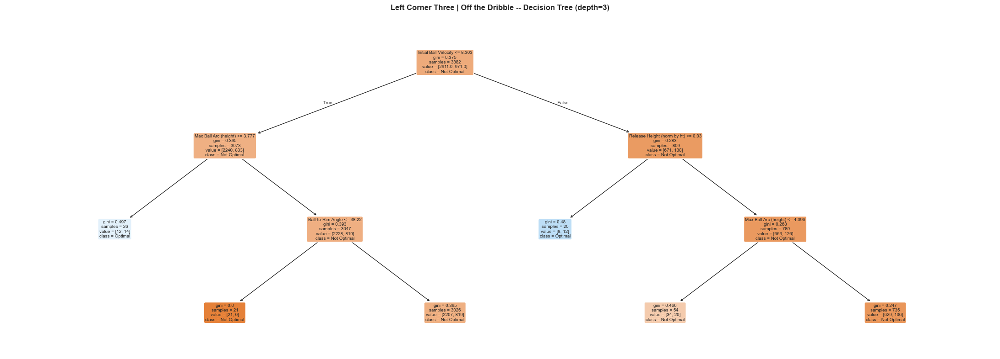


  Left Corner Three | Catch and Shoot  (n=950, optimal shots=238)
|--- Release Height (norm by ht) <= 0.03
|   |--- Max Ball Arc (height) <= 4.48
|   |   |--- Ball Velocity <= 5.48
|   |   |   |--- class: 0
|   |   |--- Ball Velocity >  5.48
|   |   |   |--- class: 0
|   |--- Max Ball Arc (height) >  4.48
|   |   |--- Initial Ball Velocity <= 8.26
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  8.26
|   |   |   |--- class: 0
|--- Release Height (norm by ht) >  0.03
|   |--- Initial Ball Velocity <= 8.33
|   |   |--- Ball Velocity <= 5.52
|   |   |   |--- class: 0
|   |   |--- Ball Velocity >  5.52
|   |   |   |--- class: 0
|   |--- Initial Ball Velocity >  8.33
|   |   |--- Ball-to-Rim Angle <= 47.22
|   |   |   |--- class: 0
|   |   |--- Ball-to-Rim Angle >  47.22
|   |   |   |--- class: 0

  (No leaf nodes predicted Optimal at this depth)


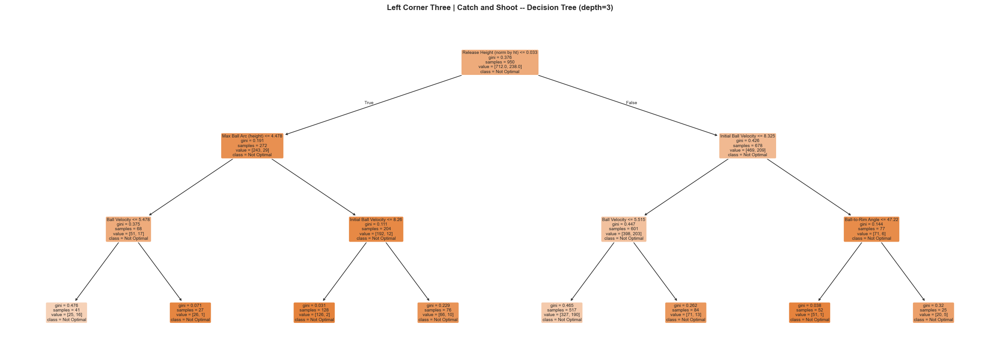


  Right Corner Three | Catch and Shoot  (n=2575, optimal shots=644)
|--- Ball Velocity <= 1.62
|   |--- Max Ball Arc (height) <= 4.59
|   |   |--- Max Ball Arc (height) <= 4.35
|   |   |   |--- class: 0
|   |   |--- Max Ball Arc (height) >  4.35
|   |   |   |--- class: 0
|   |--- Max Ball Arc (height) >  4.59
|   |   |--- Initial Ball Velocity <= 8.45
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  8.45
|   |   |   |--- class: 0
|--- Ball Velocity >  1.62
|   |--- Initial Ball Velocity <= 8.21
|   |   |--- Release Height (norm by ht) <= 0.03
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.03
|   |   |   |--- class: 0
|   |--- Initial Ball Velocity >  8.21
|   |   |--- Max Ball Arc (height) <= 4.33
|   |   |   |--- class: 0
|   |   |--- Max Ball Arc (height) >  4.33
|   |   |   |--- class: 0

  (No leaf nodes predicted Optimal at this depth)


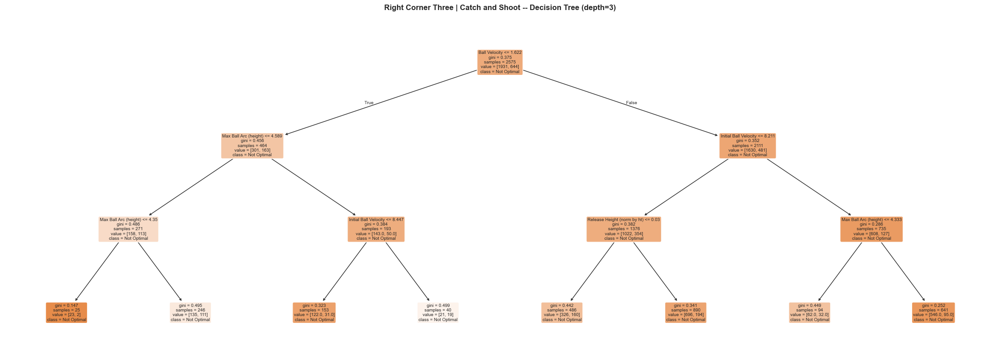


  Right Corner Three | Off the Dribble  (n=2242, optimal shots=561)
|--- Max Ball Arc (height) <= 4.47
|   |--- Ball Velocity <= 1.67
|   |   |--- Max Ball Arc (height) <= 4.44
|   |   |   |--- class: 1
|   |   |--- Max Ball Arc (height) >  4.44
|   |   |   |--- class: 0
|   |--- Ball Velocity >  1.67
|   |   |--- Initial Ball Angle <= 47.23
|   |   |   |--- class: 0
|   |   |--- Initial Ball Angle >  47.23
|   |   |   |--- class: 0
|--- Max Ball Arc (height) >  4.47
|   |--- Ball Velocity <= 1.64
|   |   |--- Initial Ball Velocity <= 8.12
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  8.12
|   |   |   |--- class: 0
|   |--- Ball Velocity >  1.64
|   |   |--- Ball-to-Rim Angle <= 47.30
|   |   |   |--- class: 0
|   |   |--- Ball-to-Rim Angle >  47.30
|   |   |   |--- class: 0

  -- Optimal Leaf Rules (joint conditions predicting a good shot) --

  Rule 1  (covers 122 shots = 5.4% of subset,  precision=0.0)
    Max Ball Arc (height) <= 4.473
    Ball Velocity <= 1.667


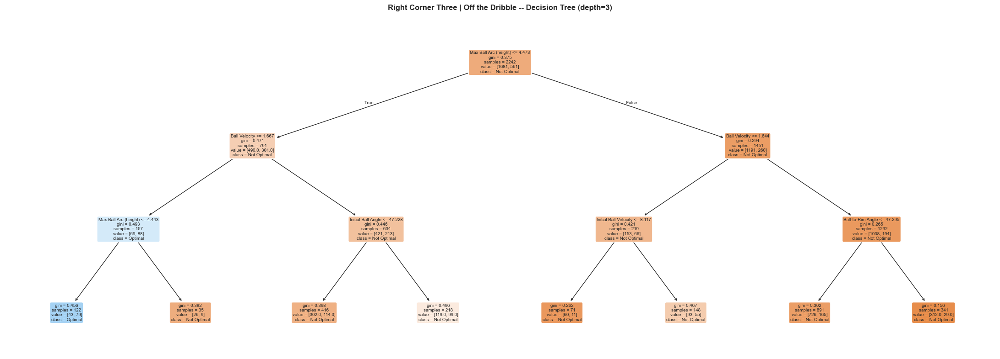


  Middle Three | Catch and Shoot  (n=4130, optimal shots=1033)
|--- Initial Ball Velocity <= 8.64
|   |--- Initial Ball Angle <= 47.16
|   |   |--- Initial Ball Velocity <= 8.37
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  8.37
|   |   |   |--- class: 0
|   |--- Initial Ball Angle >  47.16
|   |   |--- Ball Velocity <= 3.18
|   |   |   |--- class: 0
|   |   |--- Ball Velocity >  3.18
|   |   |   |--- class: 0
|--- Initial Ball Velocity >  8.64
|   |--- Initial Ball Velocity <= 8.84
|   |   |--- Max Ball Arc (height) <= 4.56
|   |   |   |--- class: 0
|   |   |--- Max Ball Arc (height) >  4.56
|   |   |   |--- class: 0
|   |--- Initial Ball Velocity >  8.84
|   |   |--- Release Height (norm by ht) <= 0.03
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.03
|   |   |   |--- class: 0

  (No leaf nodes predicted Optimal at this depth)


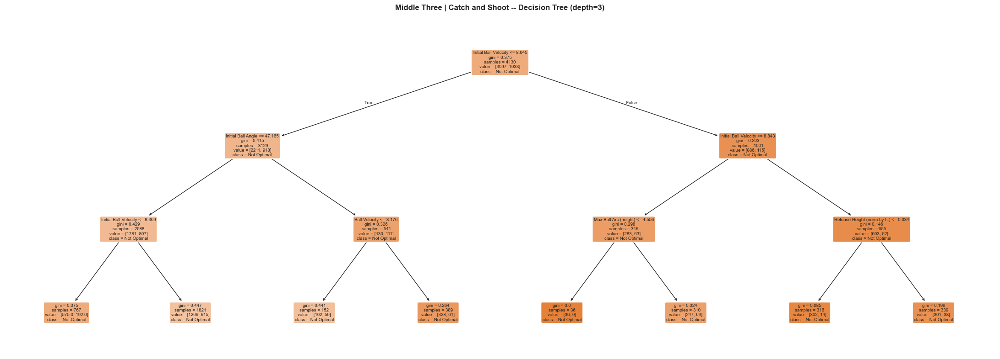


  Middle Three | Off the Dribble  (n=702, optimal shots=176)
|--- Max Ball Arc (height) <= 4.85
|   |--- Ball Velocity <= 5.69
|   |   |--- Initial Ball Velocity <= 8.30
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  8.30
|   |   |   |--- class: 0
|   |--- Ball Velocity >  5.69
|   |   |--- Release Height (norm by ht) <= 0.03
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.03
|   |   |   |--- class: 0
|--- Max Ball Arc (height) >  4.85
|   |--- Release Height (norm by ht) <= 0.03
|   |   |--- Max Ball Arc (height) <= 5.19
|   |   |   |--- class: 0
|   |   |--- Max Ball Arc (height) >  5.19
|   |   |   |--- class: 0
|   |--- Release Height (norm by ht) >  0.03
|   |   |--- Release Height (norm by ht) <= 0.03
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.03
|   |   |   |--- class: 0

  (No leaf nodes predicted Optimal at this depth)


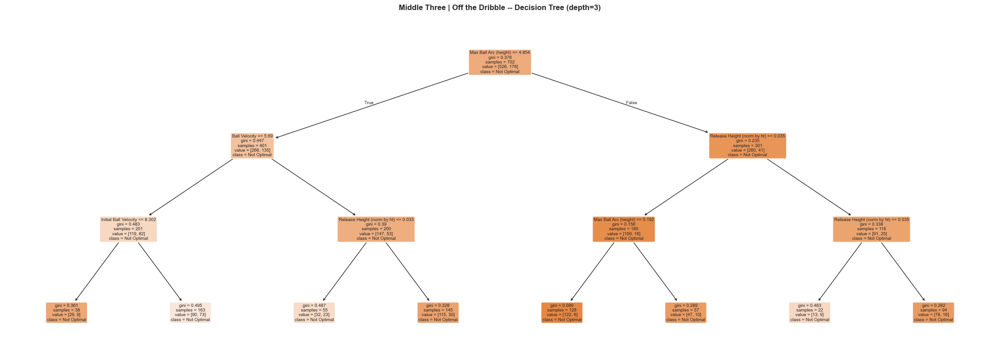


  Free Throw | All  (n=3794, optimal shots=949)
|--- Ball Velocity <= 1.37
|   |--- Initial Ball Velocity <= 6.64
|   |   |--- Max Ball Arc (height) <= 3.72
|   |   |   |--- class: 0
|   |   |--- Max Ball Arc (height) >  3.72
|   |   |   |--- class: 0
|   |--- Initial Ball Velocity >  6.64
|   |   |--- Initial Ball Velocity <= 6.73
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  6.73
|   |   |   |--- class: 0
|--- Ball Velocity >  1.37
|   |--- Initial Ball Velocity <= 6.31
|   |   |--- Ball Velocity <= 4.27
|   |   |   |--- class: 0
|   |   |--- Ball Velocity >  4.27
|   |   |   |--- class: 0
|   |--- Initial Ball Velocity >  6.31
|   |   |--- Ball Velocity <= 3.90
|   |   |   |--- class: 0
|   |   |--- Ball Velocity >  3.90
|   |   |   |--- class: 0

  (No leaf nodes predicted Optimal at this depth)


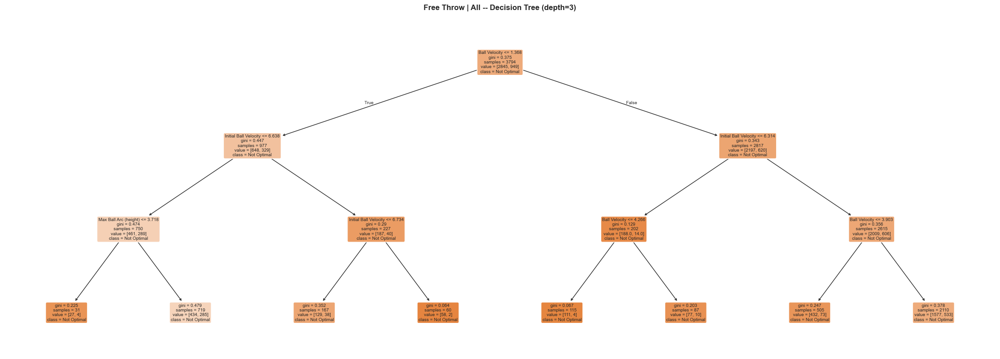


  Key | Off the Dribble  (n=1286, optimal shots=322)
|--- Initial Ball Velocity <= 6.51
|   |--- Initial Ball Velocity <= 6.14
|   |   |--- Ball-to-Rim Angle <= 48.24
|   |   |   |--- class: 0
|   |   |--- Ball-to-Rim Angle >  48.24
|   |   |   |--- class: 0
|   |--- Initial Ball Velocity >  6.14
|   |   |--- Ball Velocity <= 1.28
|   |   |   |--- class: 1
|   |   |--- Ball Velocity >  1.28
|   |   |   |--- class: 0
|--- Initial Ball Velocity >  6.51
|   |--- Initial Ball Angle <= 50.87
|   |   |--- Initial Ball Velocity <= 6.69
|   |   |   |--- class: 1
|   |   |--- Initial Ball Velocity >  6.69
|   |   |   |--- class: 0
|   |--- Initial Ball Angle >  50.87
|   |   |--- Max Ball Arc (height) <= 4.11
|   |   |   |--- class: 0
|   |   |--- Max Ball Arc (height) >  4.11
|   |   |   |--- class: 0

  -- Optimal Leaf Rules (joint conditions predicting a good shot) --

  Rule 1  (covers 52 shots = 4.0% of subset,  precision=0.0)
    Initial Ball Velocity <= 6.512
    Initial Ball Velocity >

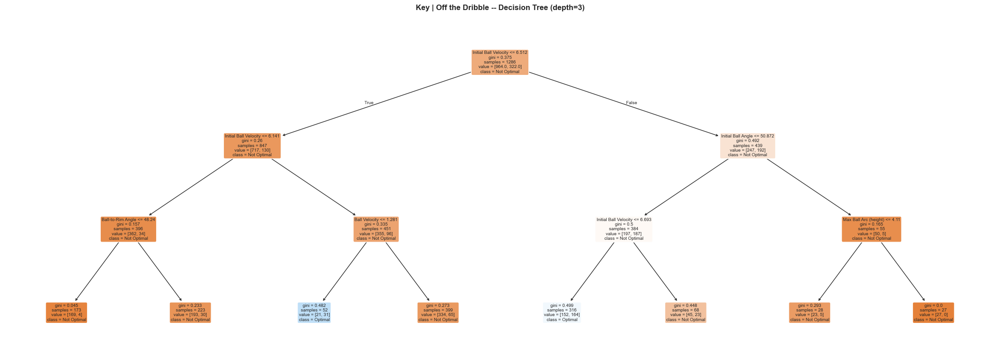


  Key | Catch and Shoot  (n=510, optimal shots=128)
|--- Initial Ball Velocity <= 6.47
|   |--- Ball Velocity <= 1.13
|   |   |--- class: 1
|   |--- Ball Velocity >  1.13
|   |   |--- Initial Ball Angle <= 46.77
|   |   |   |--- class: 0
|   |   |--- Initial Ball Angle >  46.77
|   |   |   |--- class: 0
|--- Initial Ball Velocity >  6.47
|   |--- Release Height (norm by ht) <= 0.03
|   |   |--- Initial Ball Velocity <= 6.56
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  6.56
|   |   |   |--- class: 0
|   |--- Release Height (norm by ht) >  0.03
|   |   |--- Ball Velocity <= 4.13
|   |   |   |--- class: 0
|   |   |--- Ball Velocity >  4.13
|   |   |   |--- class: 1

  -- Optimal Leaf Rules (joint conditions predicting a good shot) --

  Rule 1  (covers 36 shots = 7.1% of subset,  precision=0.0)
    Initial Ball Velocity <= 6.467
    Ball Velocity <= 1.127

  Rule 2  (covers 82 shots = 16.1% of subset,  precision=0.0)
    Initial Ball Velocity > 6.467
    Release Height

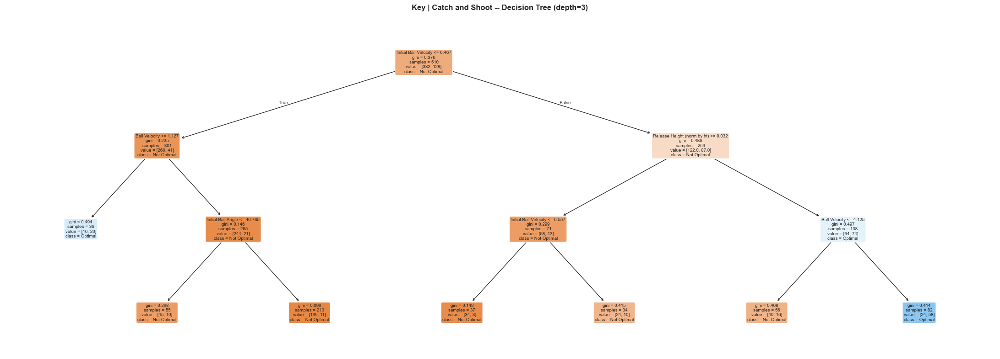


  Right Corner Two | Catch and Shoot  (n=294, optimal shots=74)
|--- Max Ball Arc (height) <= 4.70
|   |--- Initial Ball Angle <= 47.46
|   |   |--- Release Height (norm by ht) <= 0.03
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.03
|   |   |   |--- class: 0
|   |--- Initial Ball Angle >  47.46
|   |   |--- Ball-to-Rim Angle <= 45.51
|   |   |   |--- class: 1
|   |   |--- Ball-to-Rim Angle >  45.51
|   |   |   |--- class: 0
|--- Max Ball Arc (height) >  4.70
|   |--- class: 0

  -- Optimal Leaf Rules (joint conditions predicting a good shot) --

  Rule 1  (covers 20 shots = 6.8% of subset,  precision=0.0)
    Max Ball Arc (height) <= 4.703
    Initial Ball Angle > 47.457
    Ball-to-Rim Angle <= 45.51


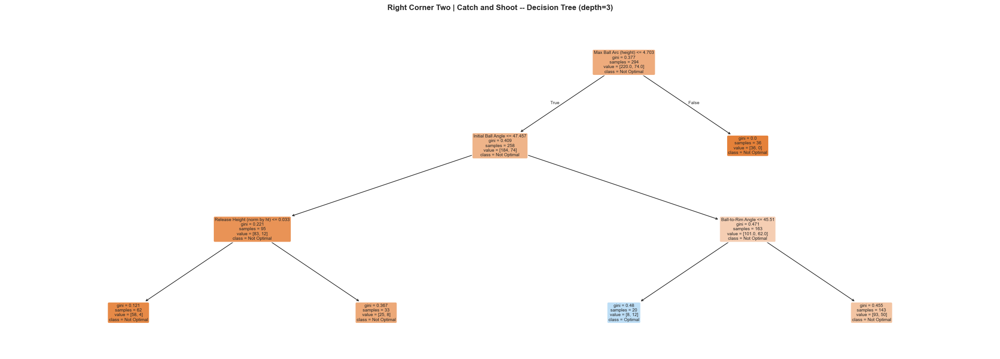


  Right Corner Two | Off the Dribble  (n=223, optimal shots=56)
|--- Ball Velocity <= 2.92
|   |--- class: 1
|--- Ball Velocity >  2.92
|   |--- Release Height (norm by ht) <= 0.03
|   |   |--- Initial Ball Velocity <= 8.13
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  8.13
|   |   |   |--- class: 0
|   |--- Release Height (norm by ht) >  0.03
|   |   |--- Initial Ball Velocity <= 6.90
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  6.90
|   |   |   |--- class: 0

  -- Optimal Leaf Rules (joint conditions predicting a good shot) --

  Rule 1  (covers 38 shots = 17.0% of subset,  precision=0.0)
    Ball Velocity <= 2.921


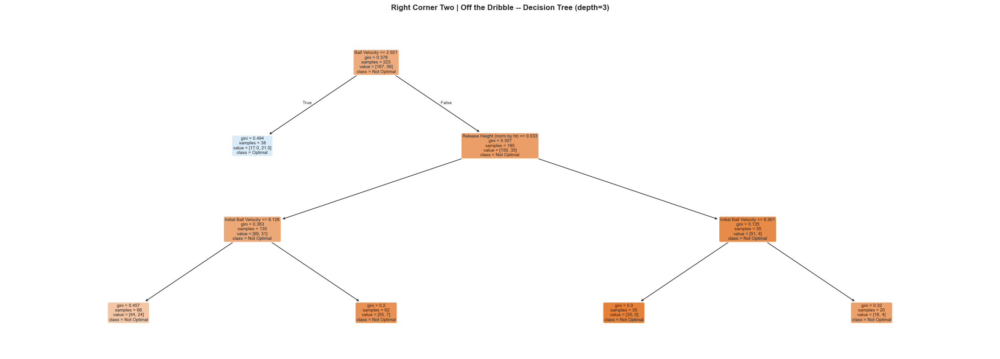


  Left Corner Two | Off the Dribble  (n=327, optimal shots=82)
|--- Ball Velocity <= 1.51
|   |--- Max Ball Arc (height) <= 4.50
|   |   |--- class: 0
|   |--- Max Ball Arc (height) >  4.50
|   |   |--- class: 1
|--- Ball Velocity >  1.51
|   |--- Initial Ball Velocity <= 8.19
|   |   |--- Max Ball Arc (height) <= 4.14
|   |   |   |--- class: 0
|   |   |--- Max Ball Arc (height) >  4.14
|   |   |   |--- class: 0
|   |--- Initial Ball Velocity >  8.19
|   |   |--- Release Height (norm by ht) <= 0.03
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.03
|   |   |   |--- class: 0

  -- Optimal Leaf Rules (joint conditions predicting a good shot) --

  Rule 1  (covers 30 shots = 9.2% of subset,  precision=0.0)
    Ball Velocity <= 1.506
    Max Ball Arc (height) > 4.504


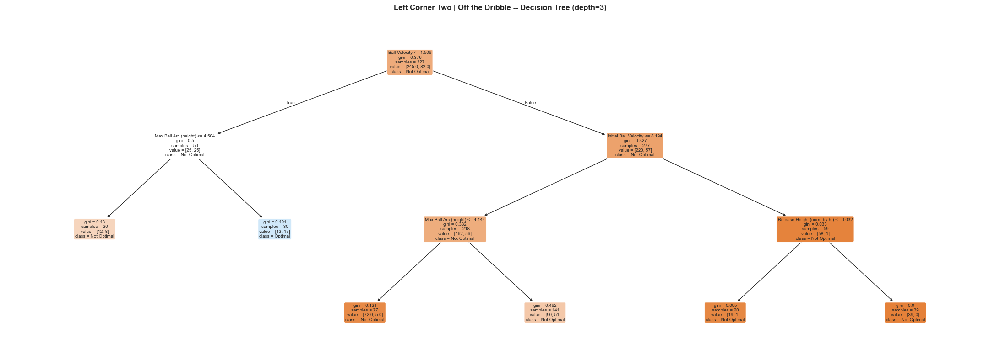


  Left Corner Two | Catch and Shoot  (n=261, optimal shots=66)
|--- Ball Velocity <= 1.37
|   |--- Initial Ball Angle <= 51.60
|   |   |--- class: 1
|   |--- Initial Ball Angle >  51.60
|   |   |--- class: 1
|--- Ball Velocity >  1.37
|   |--- Max Ball Arc (height) <= 4.38
|   |   |--- Initial Ball Angle <= 51.69
|   |   |   |--- class: 0
|   |   |--- Initial Ball Angle >  51.69
|   |   |   |--- class: 0
|   |--- Max Ball Arc (height) >  4.38
|   |   |--- Release Height (norm by ht) <= 0.03
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.03
|   |   |   |--- class: 0

  -- Optimal Leaf Rules (joint conditions predicting a good shot) --

  Rule 1  (covers 21 shots = 8.0% of subset,  precision=0.0)
    Ball Velocity <= 1.365
    Initial Ball Angle <= 51.605

  Rule 2  (covers 20 shots = 7.7% of subset,  precision=0.0)
    Ball Velocity <= 1.365
    Initial Ball Angle > 51.605


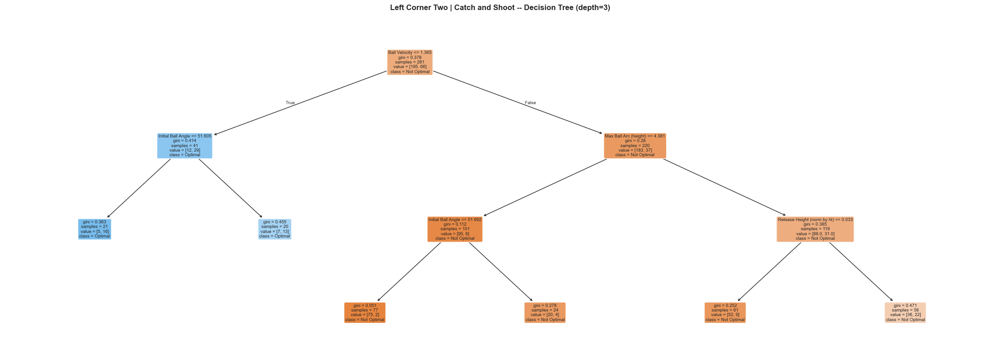


  Right Wing Two | Catch and Shoot  (n=102, optimal shots=26)
|--- Initial Ball Angle <= 48.79
|   |--- Max Ball Arc (height) <= 4.58
|   |   |--- Release Height (norm by ht) <= 0.03
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.03
|   |   |   |--- class: 0
|   |--- Max Ball Arc (height) >  4.58
|   |   |--- class: 0
|--- Initial Ball Angle >  48.79
|   |--- class: 0

  (No leaf nodes predicted Optimal at this depth)


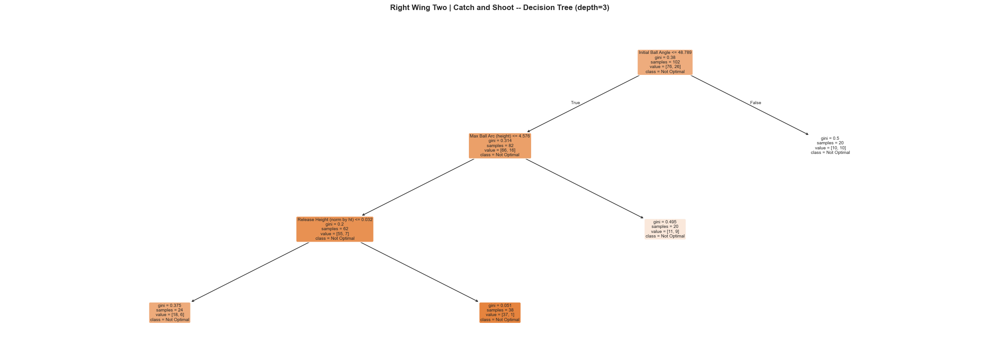


  Right Wing Three | Off the Dribble  (n=378, optimal shots=95)
|--- Release Height (norm by ht) <= 0.03
|   |--- Ball Velocity <= 5.59
|   |   |--- Initial Ball Velocity <= 8.40
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  8.40
|   |   |   |--- class: 0
|   |--- Ball Velocity >  5.59
|   |   |--- Max Ball Arc (height) <= 4.55
|   |   |   |--- class: 0
|   |   |--- Max Ball Arc (height) >  4.55
|   |   |   |--- class: 0
|--- Release Height (norm by ht) >  0.03
|   |--- Ball Velocity <= 5.98
|   |   |--- Ball Velocity <= 5.61
|   |   |   |--- class: 0
|   |   |--- Ball Velocity >  5.61
|   |   |   |--- class: 0
|   |--- Ball Velocity >  5.98
|   |   |--- class: 0

  (No leaf nodes predicted Optimal at this depth)


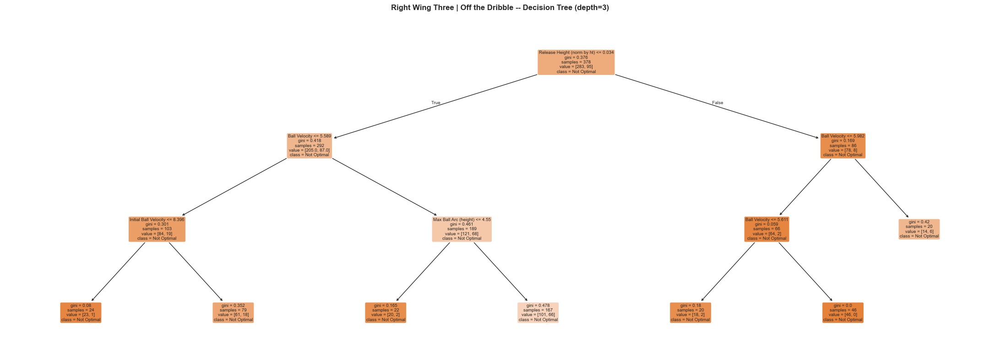


  Right Wing Three | Catch and Shoot  (n=1057, optimal shots=265)
|--- Initial Ball Velocity <= 8.29
|   |--- Ball-to-Rim Angle <= 43.03
|   |   |--- class: 0
|   |--- Ball-to-Rim Angle >  43.03
|   |   |--- class: 0
|--- Initial Ball Velocity >  8.29
|   |--- Ball-to-Rim Angle <= 46.10
|   |   |--- Ball-to-Rim Angle <= 43.59
|   |   |   |--- class: 0
|   |   |--- Ball-to-Rim Angle >  43.59
|   |   |   |--- class: 0
|   |--- Ball-to-Rim Angle >  46.10
|   |   |--- Release Height (norm by ht) <= 0.03
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.03
|   |   |   |--- class: 0

  (No leaf nodes predicted Optimal at this depth)


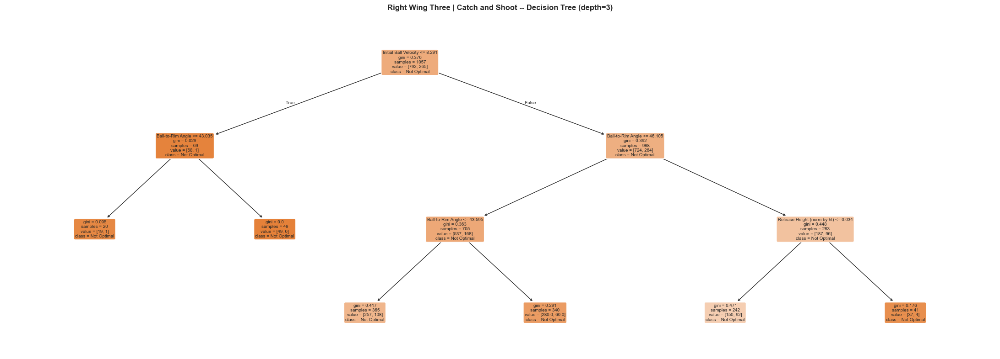


  Left Wing Two | Catch and Shoot  (n=116, optimal shots=29)
|--- Initial Ball Angle <= 43.94
|   |--- class: 0
|--- Initial Ball Angle >  43.94
|   |--- Initial Ball Angle <= 48.39
|   |   |--- Ball-to-Rim Angle <= 44.15
|   |   |   |--- class: 0
|   |   |--- Ball-to-Rim Angle >  44.15
|   |   |   |--- class: 0
|   |--- Initial Ball Angle >  48.39
|   |   |--- class: 0

  (No leaf nodes predicted Optimal at this depth)


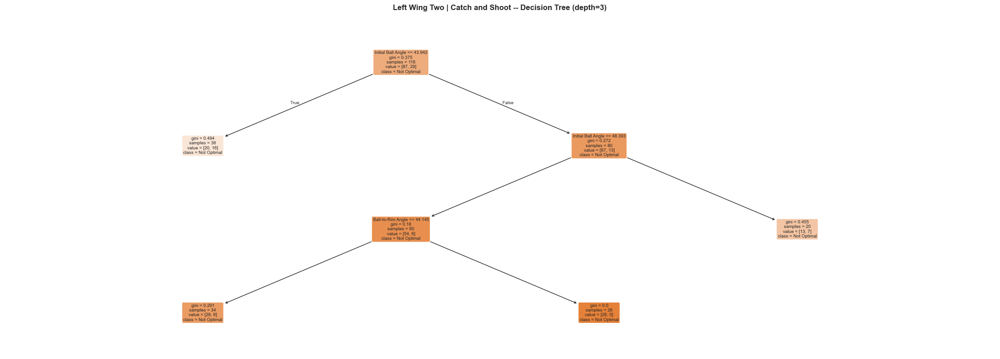


  Left Wing Three | Catch and Shoot  (n=1022, optimal shots=256)
|--- Initial Ball Angle <= 44.74
|   |--- Max Ball Arc (height) <= 4.68
|   |   |--- Initial Ball Velocity <= 8.24
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  8.24
|   |   |   |--- class: 0
|   |--- Max Ball Arc (height) >  4.68
|   |   |--- Release Height (norm by ht) <= 0.04
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.04
|   |   |   |--- class: 0
|--- Initial Ball Angle >  44.74
|   |--- Initial Ball Velocity <= 8.65
|   |   |--- Ball-to-Rim Angle <= 44.04
|   |   |   |--- class: 0
|   |   |--- Ball-to-Rim Angle >  44.04
|   |   |   |--- class: 0
|   |--- Initial Ball Velocity >  8.65
|   |   |--- Initial Ball Angle <= 45.52
|   |   |   |--- class: 0
|   |   |--- Initial Ball Angle >  45.52
|   |   |   |--- class: 0

  (No leaf nodes predicted Optimal at this depth)


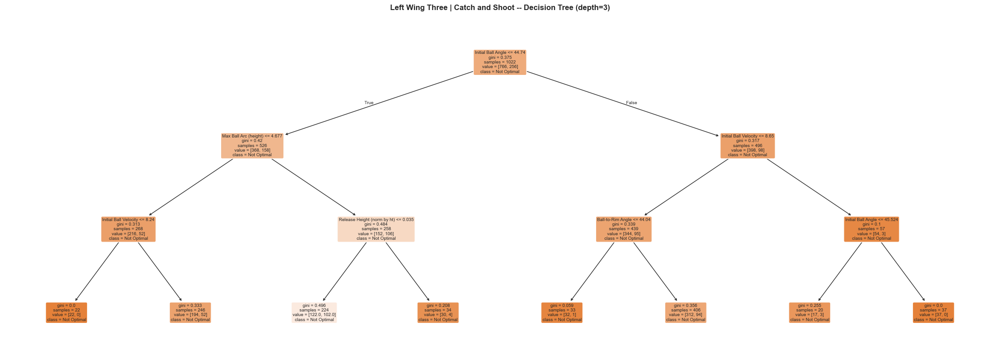


  Left Wing Three | Off the Dribble  (n=544, optimal shots=136)
|--- Max Ball Arc (height) <= 4.80
|   |--- Initial Ball Velocity <= 8.37
|   |   |--- Max Ball Arc (height) <= 4.57
|   |   |   |--- class: 0
|   |   |--- Max Ball Arc (height) >  4.57
|   |   |   |--- class: 0
|   |--- Initial Ball Velocity >  8.37
|   |   |--- Release Height (norm by ht) <= 0.03
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.03
|   |   |   |--- class: 0
|--- Max Ball Arc (height) >  4.80
|   |--- Ball Velocity <= 5.54
|   |   |--- Release Height (norm by ht) <= 0.04
|   |   |   |--- class: 0
|   |   |--- Release Height (norm by ht) >  0.04
|   |   |   |--- class: 0
|   |--- Ball Velocity >  5.54
|   |   |--- Initial Ball Velocity <= 8.61
|   |   |   |--- class: 0
|   |   |--- Initial Ball Velocity >  8.61
|   |   |   |--- class: 0

  (No leaf nodes predicted Optimal at this depth)


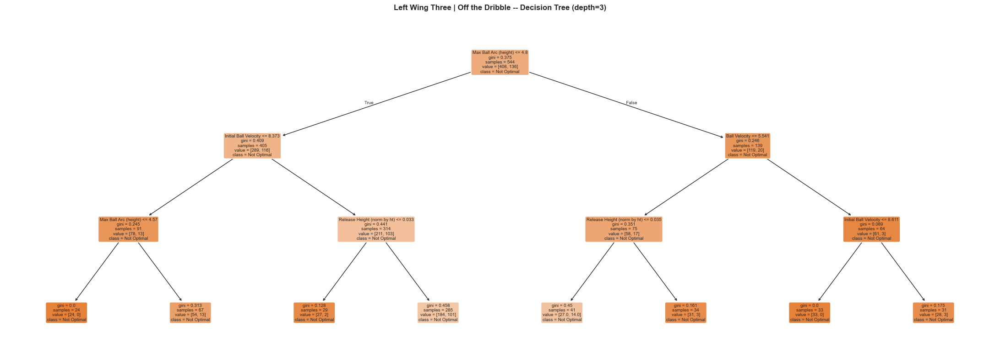


  Middle Two | Catch and Shoot  (n=447, optimal shots=112)
|--- Ball Velocity <= 1.71
|   |--- Max Ball Arc (height) <= 4.61
|   |   |--- Release Height (norm by ht) <= 0.03
|   |   |   |--- class: 1
|   |   |--- Release Height (norm by ht) >  0.03
|   |   |   |--- class: 0
|   |--- Max Ball Arc (height) >  4.61
|   |   |--- class: 0
|--- Ball Velocity >  1.71
|   |--- Ball Velocity <= 6.03
|   |   |--- Ball-to-Rim Angle <= 41.28
|   |   |   |--- class: 0
|   |   |--- Ball-to-Rim Angle >  41.28
|   |   |   |--- class: 0
|   |--- Ball Velocity >  6.03
|   |   |--- class: 0

  -- Optimal Leaf Rules (joint conditions predicting a good shot) --

  Rule 1  (covers 21 shots = 4.7% of subset,  precision=0.0)
    Ball Velocity <= 1.712
    Max Ball Arc (height) <= 4.612
    Release Height (norm by ht) <= 0.032


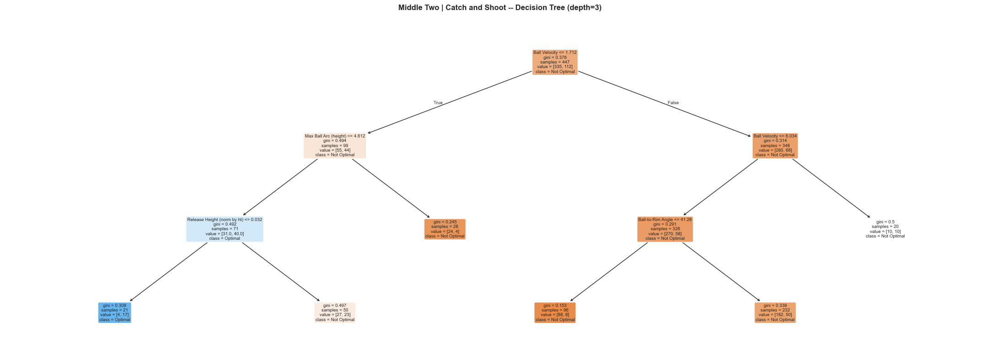


  Middle Two | Off the Dribble  (n=139, optimal shots=35)
|--- Ball-to-Rim Angle <= 43.61
|   |--- Release Height (norm by ht) <= 0.03
|   |   |--- Initial Ball Angle <= 44.16
|   |   |   |--- class: 0
|   |   |--- Initial Ball Angle >  44.16
|   |   |   |--- class: 0
|   |--- Release Height (norm by ht) >  0.03
|   |   |--- class: 1
|--- Ball-to-Rim Angle >  43.61
|   |--- Ball-to-Rim Angle <= 48.26
|   |   |--- Max Ball Arc (height) <= 4.44
|   |   |   |--- class: 0
|   |   |--- Max Ball Arc (height) >  4.44
|   |   |   |--- class: 0
|   |--- Ball-to-Rim Angle >  48.26
|   |   |--- class: 0

  -- Optimal Leaf Rules (joint conditions predicting a good shot) --

  Rule 1  (covers 24 shots = 17.3% of subset,  precision=0.0)
    Ball-to-Rim Angle <= 43.61
    Release Height (norm by ht) > 0.033


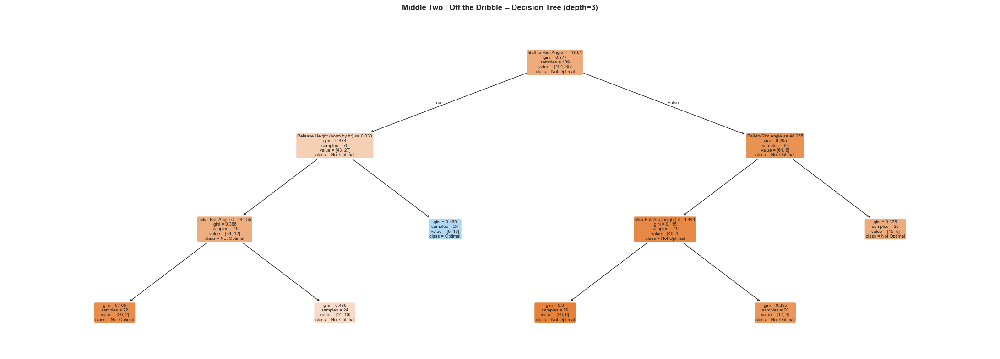


=== Section 5 Master Table: All Optimal Decision Tree Rules ===
     Shot Location       Shot Type  Rule #  n_leaf  Coverage %  Precision                                                                                         Conditions
 Left Corner Three Off the Dribble       1      26         0.7        0.0                                  Initial Ball Velocity <= 8.303 AND Max Ball Arc (height) <= 3.777
 Left Corner Three Off the Dribble       2      20         0.5        0.0                              Initial Ball Velocity > 8.303 AND Release Height (norm by ht) <= 0.03
Right Corner Three Off the Dribble       1     122         5.4        0.0       Max Ball Arc (height) <= 4.473 AND Ball Velocity <= 1.667 AND Max Ball Arc (height) <= 4.443
               Key Off the Dribble       1      52         4.0        0.0        Initial Ball Velocity <= 6.512 AND Initial Ball Velocity > 6.141 AND Ball Velocity <= 1.281
               Key Off the Dribble       2     316        24.6        

,Shot Location,Shot Type,Rule #,n_leaf,Coverage %,Precision,Conditions
0,Left Corner Three,Off the Dribble,1,26,0.7,0.0,Initial Ball Velocity <= 8.303 AND Max Ball Ar...
1,Left Corner Three,Off the Dribble,2,20,0.5,0.0,Initial Ball Velocity > 8.303 AND Release Heig...
2,Right Corner Three,Off the Dribble,1,122,5.4,0.0,Max Ball Arc (height) <= 4.473 AND Ball Veloci...
3,Key,Off the Dribble,1,52,4.0,0.0,Initial Ball Velocity <= 6.512 AND Initial Bal...
4,Key,Off the Dribble,2,316,24.6,0.0,Initial Ball Velocity > 6.512 AND Initial Ball...
5,Key,Catch and Shoot,1,36,7.1,0.0,Initial Ball Velocity <= 6.467 AND Ball Veloci...
6,Key,Catch and Shoot,2,82,16.1,0.0,Initial Ball Velocity > 6.467 AND Release Heig...
7,Right Corner Two,Catch and Shoot,1,20,6.8,0.0,Max Ball Arc (height) <= 4.703 AND Initial Bal...
8,Right Corner Two,Off the Dribble,1,38,17.0,0.0,Ball Velocity <= 2.921
9,Left Corner Two,Off the Dribble,1,30,9.2,0.0,Ball Velocity <= 1.506 AND Max Ball Arc (heigh...


In [138]:
from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree
from sklearn.tree import _tree

OPTIMAL_PERCENTILE_SEC5 = 25   # bottom X% of predicted BDfC = "optimal"
DT_MAX_DEPTH = 3               # increase to 4 for more granular rules
DT_MIN_SAMPLES_LEAF = 10       # minimum shots in a leaf node
# A leaf qualifies as "optimal-enriched" if its precision exceeds this.
# Set just above the base rate (OPTIMAL_PERCENTILE_SEC5 / 100) so enriched-but-not-majority
# leaves are also surfaced. Lower this to surface more rules; raise it for stricter rules.
MIN_LEAF_PRECISION = 0.30

def get_optimal_rules(dt, feature_names, min_precision=MIN_LEAF_PRECISION):
    """Return rule paths for all leaf nodes whose precision >= min_precision."""
    tree_ = dt.tree_
    feat_names = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "?"
        for i in tree_.feature
    ]
    results = []

    def recurse(node, path):
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            thresh = round(float(tree_.threshold[node]), 3)
            recurse(tree_.children_left[node],  path + [(feat_names[node], "<=", thresh)])
            recurse(tree_.children_right[node], path + [(feat_names[node], ">",  thresh)])
        else:
            n_total   = int(tree_.n_node_samples[node])
            n_opt     = int(tree_.value[node][0][1])
            precision = round(n_opt / n_total, 3)
            if precision >= min_precision:
                results.append({
                    "conditions": path,
                    "n_leaf":     n_total,
                    "n_optimal":  n_opt,
                    "precision":  precision,
                })

    recurse(0, [])
    # Sort best precision first
    results.sort(key=lambda r: r["precision"], reverse=True)
    return results

all_dt_rules = []

for loc, shot_type, subset in combos_sec6:
    label = loc + " | " + shot_type
    n = len(subset)
    base_rate = round(OPTIMAL_PERCENTILE_SEC5 / 100, 3)
    feat_labels = [PREDICTOR_LABELS[p] for p in PREDICTORS]

    # Step 1: Fit RF on all 6 predictors -> predicted BDfC
    rf = RandomForestRegressor(n_estimators=200, random_state=42, n_jobs=-1)
    rf.fit(subset[PREDICTORS], subset[TARGET])

    subset = subset.copy()
    subset["predicted_BDfC"] = rf.predict(subset[PREDICTORS])

    # Step 2: Label shots as Optimal (bottom OPTIMAL_PERCENTILE_SEC5 % predicted BDfC)
    threshold = subset["predicted_BDfC"].quantile(OPTIMAL_PERCENTILE_SEC5 / 100)
    subset["is_optimal"] = (subset["predicted_BDfC"] <= threshold).astype(int)
    n_optimal = subset["is_optimal"].sum()

    # Step 3: Fit shallow decision tree to classify Optimal vs Not Optimal
    dt = DecisionTreeClassifier(
        max_depth=DT_MAX_DEPTH,
        min_samples_leaf=DT_MIN_SAMPLES_LEAF,
        random_state=42,
    )
    dt.fit(subset[PREDICTORS], subset["is_optimal"])

    print()
    print("=" * 70)
    print("  " + label + "  (n=" + str(n) + ", optimal shots=" + str(n_optimal) +
          ", base rate=" + str(base_rate) + ")")
    print("=" * 70)

    # Step 4: Print full tree text
    print(export_text(dt, feature_names=feat_labels))

    # Step 5: Extract and print optimal-enriched leaf rules
    rules = get_optimal_rules(dt, feat_labels, min_precision=MIN_LEAF_PRECISION)
    if rules:
        print("  -- Optimal-Enriched Leaf Rules (precision >= " + str(MIN_LEAF_PRECISION) +
              ", base rate=" + str(base_rate) + ") --")
        for i, rule in enumerate(rules, 1):
            cov_pct = round(rule["n_leaf"] / n * 100, 1)
            lift    = round(rule["precision"] / base_rate, 2)
            print()
            print("  Rule " + str(i) +
                  "  (n=" + str(rule["n_leaf"]) + ", coverage=" + str(cov_pct) +
                  "%, precision=" + str(rule["precision"]) +
                  ", lift=" + str(lift) + "x)")
            for cond in rule["conditions"]:
                print("    " + cond[0] + " " + cond[1] + " " + str(cond[2]))
            all_dt_rules.append({
                "Shot Location": loc,
                "Shot Type":     shot_type,
                "Rule #":        i,
                "n_leaf":        rule["n_leaf"],
                "Coverage %":    cov_pct,
                "Precision":     rule["precision"],
                "Lift":          lift,
                "Conditions":    " AND ".join(
                    c[0] + " " + c[1] + " " + str(c[2]) for c in rule["conditions"]
                ),
            })
    else:
        print("  (No enriched leaves found -- try lowering MIN_LEAF_PRECISION or increasing DT_MAX_DEPTH)")

    # Step 6: Visualize the tree
    fig, ax = plt.subplots(figsize=(22, 8))
    plot_tree(
        dt,
        feature_names=feat_labels,
        class_names=["Not Optimal", "Optimal"],
        filled=True, rounded=True,
        ax=ax, fontsize=7,
    )
    fig.suptitle(label + " -- Decision Tree (depth=" + str(DT_MAX_DEPTH) + ")",
                 fontsize=12, fontweight="bold")
    plt.tight_layout()
    plt.show()

# Master table of all optimal rules
print()
print("=== Section 5 Master Table: All Optimal-Enriched Decision Tree Rules ===")
dt_rules_df = pd.DataFrame(all_dt_rules)
if not dt_rules_df.empty:
    print(dt_rules_df[["Shot Location", "Shot Type", "Rule #", "n_leaf",
                        "Coverage %", "Precision", "Lift", "Conditions"]].to_string(index=False))
dt_rules_df
